In [1]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from collections import Counter, defaultdict
from nltk.util import ngrams
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import os
import glob

In [2]:
# Define custom AE categories with expanded keywords
custom_AE_categories = {
    'Cardiovascular Issues': ['hypertension', 'heart attack', 'myocardial infarction', 'ventriculare failure', 'left ventricular hypertrophy',
                              'pulmonary arterial hypertension', 'angina pectoris', 'hypotension', 'heart rate increased', 'nerve compression',
                             'blood pressure increased', 'blood pressure diastolic abnormal', 'aortic stenosis', 'peripheral ischaemia',
                             'tachycardia', 'thrombosis', 'heart rate irregular', 'cardiac failure congestive', 'pericardial effusion',
                             'aortic valve disease', 'cardiac pacemaker removal', 'stent placement', 'trifascicular block', 'arrhythmia',
                             'bradycardia', 'cardiac valve disease', 'coronary angioplasty', 'myocardial infarction', 'acute myocardial infarction',
                             'cardiogenic shock', 'sinus tachycardia', 'palpitations', 'diastolic dysfunction', 'cardiac failure',
                             'cardiac disorder', 'atrial fibrillation', 'pulmonary embolism', 'n-terminal prohormone brain natriuretic peptide increased',
                             'troponin increased', 'tachyarrhythmia', 'heart transplant', 'troponin t', 'myocarditis', 'pericarditis',
                             'cardio-respiratory arrest', 'chronic left ventricular failure', 'central venous catheterisation', 'n-terminal prohormone brain natriuretic peptide increased',
                             'cardio-respiratory arrest', 'heart rate decreased', 'cardiomyopathy'],
    
    'Metabolic Disorder': ['diabetes mellitus', 'hyperglycemia', 'hyperuricaemia', 'hypoglycemia', 'blood glucose fluctuation', 'diabetes insipidus',
                          'diabetes mellitus inadequate control', 'blood glucose increased', 'glycosylated haemoglobin increased', 'hyperlipidaemia',
                          'hypercalcaemia', 'blood thyroid stimulating hormone increased', 'adrenocorticotropic hormone deficiency',
                           'blood thyroid stimulating hormone decreased', 'blood corticotrophin increased', 'hypothyroidism', 'hypocalcaemia',
                          'hypomagnesaemia', 'alkalosis', 'protein deficiency', 'hyperthyroidism', 'diabetic ketoacidosis', 'aspartate aminotransferase increased',
                          'thyroid disorder', 'malnutrition', 'blood creatinine increased', 'hyperkalaemia', 'hyperhidrosis', 'anti-insulin antibody increased',
                          'hypoglycaemic coma', 'insulin resistance', 'macroangiopathy', "addison's disease", 'euglycaemic diabetic ketoacidosis',
                          'insulin autoimmune syndrome', 'blood glucose decreased', 'blood potassium decreased', 'blood pressure systolic increased',
                          'body temperature decreased', 'hypokalaemia', 'diabetic foot', 'secretion discharge', 'hepatic enzyme increased',
                          'acidosis', 'blood glucose abnormal', 'prophylaxis against transplant rejection', 'metabolic acidosis', 'transaminases increased',
                           'type 2 diabetes mellitus', 'diabetic ketosis', 'blood creatine phosphokinase increased', 'blood cholesterol abnormal',
                          'hypopituitarism', 'secondary adrenocortical insufficiency', 'immunodeficiency', 'endocrine disorder', 'blood phosphorus increased',
                          'blood uric acid increased', 'blood lactate dehydrogenase increased', 'cold sweat', 'diabetic hepatopathy', 
                          'type 1 diabetes mellitus', 'lipids increased', 'splenomegaly', 'insulin-requiring type 2 diabetes mellitus',
                          'carbon dioxide decreased', 'blood lactate dehydrogenase decreased', 'blood uric acid decreased', 'blood sodium decreased',
                            'blood chloride decreased', 'haematocrit decreased', 'blood fibrinogen increased', 'c-reactive protein increased', 'lymphocyte count decreased',
                           'basophil count increased', 'monocyte count increased', 'blood bilirubin decreased', 'blood calcium decreased', 'eosinophil count increased',
                            'neutrophil count increased', 'interleukin level increased', 'lymphocyte count increased', 'fibrin d dimer increased', 'blood fibrinogen decreased',
                          'serum ferritin increased', 'pseudohyponatraemia', 'post transplant lymphoproliferative disorder', 'hypovolaemia',
                          'lactic acidosis', 'glycosuria', 'anaphylactic shock', 'oxygen consumption increased', 'ammonia increased', 
                          'hyperglycaemia', 'hypoglycaemia', 'hypersensitivity', 'gamma-glutamyltransferase increased', 'infusion related reaction',
                          'therapeutic response decreased', 'adrenal insufficiency', 'drug ineffective', 'malignant neoplasm progression', 
                          'drug intolerance', 'blood thyroid stimulating hormone increased', 'blood thyroid stimulating hormone decreased', 
                          'drug resistance', 'neoplasm malignant', 'drug hypersensitivity', 'therapeutic product effect decreased',
                          'type iii immune complex mediated reaction', 'anti-insulin antibody increased', "addison's disease", 'immunosuppressant drug level decreased',
                          'drug interaction', 'graft versus host disease', 'troponin t', 'c-reactive protein increased', 'metastases to lymph nodes',
                          'medullary thyroid cancer', 'anion gap increased', 'dyslipidaemia', 'diabetic nephropathy', 'ketonuria'],
    
    'Skin Conditions': ['rash', 'eczema', 'psoriasis', 'rash pruritic', 'pustule', 'acute generalised exanthematous pustulosis',
                        'eczema asteatotic', 'urticaria', 'herpes zoster', 'pruritus', 'night sweats', 'stevens-johnson syndrome', 'erythema multiforme',
                       'superficial vein thrombosis', 'angioedema', 'cellulitis', 'flushing', 'swelling face', 'lip swelling', 
                       'erythema', 'rash erythematous', 'oedema', 'pallor', 'thermal burn', 'erysipelas', 'swelling', 'peripheral swelling',
                       'skin cancer', 'eczema', 'injection site atrophy', 'injection site urticaria', 'skin exfoliation', 'ecchymosis',
                       'infected skin ulcer', 'abscess limb', 'palmar-plantar erythrodysaesthesia syndrome', 'hot flush', 'psoriasis',
                       'contusion', 'burns third degree', 'impaired healing', 'wound secretion', 'injection site rash', 'rash macular',
                       'application site erythema', 'scratch', 'malignant melanoma', 'skin abrasion', 'cutaneous amyloidosis',
                       'injection site inflammation', 'injection site infection', 'injection site erythema', 'injection site mass', 'dermal cyst',
                       'toxic epidermal necrolysis', 'lack of application site rotation', 'stevens-johnson syndrome', 'alopecia', 'wound closure',
                       'palmar-plantar erythrodysaesthesia syndrome', 'blister', 'photosensitivity reaction'],
    
    'Visual Disorder': ['blindness', 'visual impairment', 'cataract', 'uveitis', 'cytomegalovirus chorioretinitis', 'eye haemorrhage',
                       'diabetic retinopathy', 'iridocyclitis', 'retinopathy', 'vision blurred', 'glaucoma', 'eye disorder', 'retinal pigmentation',
                       'dry age-related macular degeneration', 'vitreous floaters', 'blindness unilateral', 'cataract nuclear', 'cataract diabetic',
                       'diplopia', 'dry age-related macular degeneration', 'amaurosis'],
    
    'Joint Disorder': ['chondrocalcinosis', 'joint effusion', 'joint swelling', 'rheumatoid arthritis', 'knee arthroplasty', 'arthritis',
                      'arthropathy', 'swollen joint count', 'synovitis', 'meniscus injury', 'joint injury'],
    
    'Digestive Disorder': ['pancreatitis acute', 'diarrhoea', 'gastrointestinal disorder', 'congestive hepatopathy', 'stomatitis', 'enterocolitis',
                          'pancreatic carcinoma', 'dehydration', 'oesophageal varices haemorrhage', 'hyponatraemia', 'cholangitis acute', 'anal haemorrhage',
                          'gastrointestinal haemorrhage', 'cholecystitis', 'haematochezia', 'biliary obstruction', 'constipation',
                          'dyspepsia', 'rectal ulcer haemorrhage', 'mucosal inflammation', 'gastroenteritis', 'pancreatitis',
                           'tooth disorder', 'pancreatic cyst', 'gastrectomy', 'foreign body in mouth', 'starvation', 'colitis ulcerative',
                          'colorectal adenoma', 'large intestine polyp', 'hypervolaemia', 'diverticulum intestinal', 'haemorrhoids',
                          'gingival swelling', 'tongue eruption', 'gastrooesophageal reflux disease', 'throat clearing',
                          'feeding disorder', 'overflow diarrhoea', 'gastrointestinal motility disorder', 'pancreas infection', 'rectal haemorrhage',
                          'rectal tenesmus', 'proctalgia', 'diarrhoea haemorrhagic', 'gastrointestinal inflammation', 'dry mouth', 'hunger',
                          'oral candidiasis', 'hypophagia', 'pneumobilia', 'early satiety', 'biliary sepsis', 'cholelithiasis', 'gallbladder rupture',
                          'gingival bleeding', 'pharyngeal paraesthesia', 'throat tightness', 'throat irritation', 'small intestinal obstruction',
                          'helicobacter gastritis', 'impaired gastric emptying', 'colitis ischaemic', 'tooth fracture', 'toothache', 'diverticular perforation',
                          'dysphagia', 'enterocutaneous fistula', 'flatulence', 'enteral nutrition', 'portal venous gas', 'decreased appetite',
                          'thirst', 'gastric disorder', 'gastric cancer', 'clostridium difficile colitis', 'eructation', 'intraductal papillary-mucinous carcinoma of pancreas'],
    
    'Liver Disorder': ['liver disorder', 'gamma-glutamyltransferase increased', 'alanine aminotransferase increased', 'blood alkaline phosphatase increased',
                      'blood bilirubin increased', 'cholestasis', 'liver abscess', 'jaundice', 'steatohepatitis', 'hepatic cirrhosis', 'autoimmune hepatitis',
                      'hypoalbuminaemia', 'hypertransaminasaemia', 'liver function test decreased', 'hepatotoxicity', 'hepatocellular carcinoma',
                      'hepatic steatosis', 'cholecystitis acute', 'hepatic failure', 'perihepatic abscess', 'drug-induced liver injury',
                      'liver function test increased', 'hepatomegaly', 'vanishing bile duct syndrome', 'drug-induced liver injury','mauriac syndrome',
                      'hepatic cancer', 'prothrombin time prolonged'],
    
    'Kidney Disorder': ['renal', 'renal disorder', 'renal injury', 'renal failure', 'kidney', 'nephrogenic anaemia', 'chronic kidney disease',
                        'polyuria', 'polydipsia', 'blood potassium increased', 'nephrolithiasis', 'renal impairment', 'proteinuria', 'tubulointerstitial nephritis',
                       'urinary tract disorder', 'urosepsis', 'post streptococcal glomerulonephritis', 'albumin urine present',
                       'glomerular filtration rate decreased', 'blood creatine increased', 'renal tubular necrosis', 'urinary incontinence', 
                       'drug clearance decreased', 'blood urea increased', 'cystitis', 'pollakiuria', 'urinary tract obstruction', 'pyelonephritis',
                       'renal transplant', 'emphysematous pyelonephritis', 'kidney infection', 'urethral stent removal', 'microalbuminuria'],
    
    'Weight Disorder': ['weight increased', 'weight gain', 'weight decreased', 'increased appetite', 'eating disorder', 'cachexia', 'lipoatrophy',
                       'weight fluctuation'],
    
    'Neonatal Disorder': ['premature', 'premature baby', 'neutropenia neonatal', 'premature delivery', 'retained placenta or membranes',
                         'low birth weight baby', 'retained placenta or membranes', 'developmental delay'],
    
    'Foetal Disorder': ['foetal exposure during pregnancy', 'foetal disorder', 'endometrial disorder', 'exposure during pregnancy',
                       'foetal death', 'umbilical cord abnormality', 'maternal exposure during pregnancy', 'amniotic fluid volume decreased',
                       'stillbirth', 'pre-eclampsia', 'maternal exposure before pregnancy', 'preterm premature rupture of membranes',
                       'pre-eclampsia', 'obstructed labour'],
    
    'Stroke': ['ischaemic stroke', 'stroke', 'seizure', 'cerebrovascular accident', 'transient ischaemic attack', 'cerebral infarction', 
              'lacunar infarction'],
    
    'Pain': ['chest pain', 'headache', 'oropharyngeal pain', 'arthralgia', 'abdominal pain', 'abdominal pain upper', 'muscle spasms', 'pain in extremity',
            'injection site pain', 'oropharyngeal discomfort', 'injection site pruritus', 'tenderness', 'pain', 'procedural pain',
            'abdominal pain lower', 'pleuritic pain', 'musculoskeletal pain', 'neuralgia', 'limb discomfort', 'spinal pain', 'breast pain',
            'back pain', 'oral pain', 'inflammatory pain', 'migraine', 'toothache', 'application site pain'],
    
    'Morphologic Abnormality': ['peripheral oedema', 'diverticulitis', 'ascites', 'abscess', 'fibrosis', 'injection site extravasation', 'peritonitis',
                               'lack of application site rotation'],
    
    'Discomfort': ['discomfort', 'chest discomfort', 'dizziness','asthenia', 'fatigue', 'vertigo', 'malaise', 'hypersomnia', 'fall', 'presyncope',
                  'illness', 'loss of consciousness', 'sopor', 'syncope', 'sleep disorder', 'abdominal discomfort', 'lethargy', 'somnolence',
                  'balance disorder', 'seasonal allergy', 'sleep disorder due to a general medical condition', 'insomnia', 'nervousness',
                  'loss of personal independence in daily activities', 'feeling hot', 'tinnitus', 'condition aggravated', 'restlessness',
                  'poor quality sleep', 'ketoacidosis', 'hypernatraemia'],
    
    'Respiratory Disorder': ['obstructive airways disorder', 'diaphragmatic disorder', 'wheezing', 'asthma', 'dyspnoea', 'hypoxia', 'cough',
                             'epistaxis', 'influenza', 'pneumonia', 'nasopharyngitis', 'influenza like illness', 'bronchopulmonary aspergillosis',
                            'covid-19', 'tachypnoea', 'respiratory disorder', 'pneumonitis', 'covid-19 pneumonia', 'respiratory failure',
                            'pleural effusion', 'pulmonary oedema', 'kussmaul respiration', 'hyperventilation', 'pneumonia aspiration',
                            'chronic obstructive pulmonary disease', 'respiratory distress', 'upper respiratory tract infection',
                            'infective pulmonary exacerbation of cystic fibrosis', 'respiratory rate increased', 'respiratory symptom',
                            'klebsiella bacteraemia', 'hypoventilation', 'dyspnoea exertional', 'sinusitis', 'post-acute covid-19 syndrome',
                            'pneumonia pneumococcal', 'nasal obstruction', 'respiratory tract infection', 'rhinorrhoea', 'nasal congestion',
                            'rhinovirus infection', 'enterovirus infection', 'lung neoplasm malignant', 'lung disorder', 'pneumonia cryptococcal',
                            'acute respiratory distress syndrome', 'acute respiratory failure', 'non-cardiogenic pulmonary oedema',
                            'tonsillitis', 'pulmonary toxicity', 'asthma-chronic obstructive pulmonary disease overlap syndrome', 'pulmonary hypertension',
                            'interstitial lung disease', 'haemoptysis', 'tracheostomy', 'pneumonia viral', 'pneumonia bacterial',
                            'viral pharyngitis', 'inhalation therapy', 'asthma-chronic obstructive pulmonary disease overlap syndrome',
                            'mechanical ventilation', 'bronchitis', 'sleep apnoea syndrome', 'pulmonary mass'],
    
    'Fever': ['pyrexia', 'chills'],
    
    'Nausea': ['nausea', 'vomiting', 'anaphylactic reaction', 'mast cell activation syndrome'],
    
    'Blood Disorder': ['pancytopenia', 'neutropenia', 'pseudomonal bacteraemia', 'blood pressure diastolic abnormal',
                      'escherichia bacteraemia', 'anaemia', 'acute myeloid leukaemia', 'neutrophil count decreased',
                      'psoriatic arthropathy', 'autoimmune disorder', 'cytopenia', 'febrile neutropenia', 'leukopenia', 'platelet count decreased',
                      'immune system disorder', 'decreased immune responsiveness', 'streptococcal bacteraemia', 'myelosuppression',
                      'haematuria', 'haemoglobin decreased', 'essential hypertension', 'red blood cell count decreased', 'blood fibrinogen increased',
                      'mean platelet volume decreased', 'white blood cell count decreased', 'band neutrophil percentage increased',
                      'leukocytosis', 'iron deficiency anaemia', 'blood disorder', 'platelet distribution width decreased', 'full blood count abnormal', 'red blood cell count decreased',
                      'white blood cell count decreased', 'haemolysis', 'thrombocytopenia', 'deep vein thrombosis', 'blood pressure decreased', 'peripheral arterial occlusive disease',
                        'varicose vein', 'circulatory collapse', 'international normalised ratio increased', 'myoglobin blood increased',
                        'shock', 'haemorrhage', 'post procedural haemorrhage', 'bladder tamponade', 'haematemesis', 'bacteraemia',
                        'splenic vein occlusion', 'immune thrombocytopenia', 'prothrombin time shortened', 'hypovolaemic shock', 'fibrin d dimer increased',
                      'blood bilirubin unconjugated increased', 'prothrombin level decreased', 'chronic granulomatous disease', 'agranulocytosis',
                      'haematoma'],
    
    'Musculoskeletal Disorder': ['osteoarthritis', 'myopathy', 'intervertebral disc protrusion', 'recurrence of neuromuscular blockade', 'tremor',
                                'musculoskeletal disorder', 'cervical vertebral fracture', 'vertebral body replacement', 'grip strength decreased',
                                'extradural abscess', 'back disorder', 'muscle tightness', 'hiatus hernia', 'gait inability',
                                'bone erosion', 'gait disturbance', 'physical deconditioning', 'multiple fractures', 'essential tremor',
                                'spinal stenosis', 'leg amputation', 'muscular weakness', 'foot fracture', 'bone demineralisation',
                                'osteonecrosis', 'bone density decreased', 'skeletal injury', 'skeletal injury', 'bone loss', 'bedridden',
                                'immobile', 'mobility decreased', 'rhabdomyolysis', 'peripheral coldness', 'ligament disorder', 'dysstasia', 'waist circumference increased',
                                'stenosis', 'femur fracture', 'intervertebral disc displacement', 'neck injury', 'sternal fracture',
                                'rotator cuff syndrome', 'rib fracture', 'clavicle fracture', 'restless legs syndrome', 'facial bones fracture',
                                'akinesia', 'monoplegia', 'spinal fracture', 'myalgia', 'steroid therapy', 'blood creatine phosphokinase decreased',
                                'hemiparesis', 'myasthenia gravis', 'myositis', 'upper limb fracture', 'limb mass'],
    
    'Spinal Cord Disorder': ['myelopathy', 'spinal cord compression'],
    
    'Neurological Disorder': ['peripheral sensorimotor neuropathy', 'micturition disorder', 'neuropathy peripheral', 'movement disorder', 
                               'craniocerebral injury', 'diabetic neuropathy', 'hepatic encephalopathy', 'paraesthesia', 'autonomic nervous system imbalance',
                               'cranial nerve paralysis', 'nerve injury', 'meningitis aseptic', 'subdural haematoma', 'parkinsonism',
                               'memory impairment', 'amnesia', 'cerebellar syndrome', 'hypoaesthesia', 'encephalopathy', 'disturbance in attention',
                                'subarachnoid haemorrhage', 'brain natriuretic peptide abnormal', 'neurotoxicity', 'small fibre neuropathy',
                             "huntington's disease", 'central nervous system lymphoma', 'head injury', 'cerebral haemorrhage', 'intraventricular haemorrhage',
                             'brain injury', 'unresponsive to stimuli', 'recurrence of neuromuscular blockade', "huntington's disease",'epilepsy'],
    
    'Infectious Disorder': ['septic shock', 'systemic candida', 'viral infection', 'systemic infection', 'staphylococcal infection', 'aspergillus infection',
                           'sepsis', 'respiratory syncytial virus infection', 'urinary tract infection', 'cytokine release syndrome',
                           'haemophagocytic lymphohistiocytosis', 'wound infection bacterial', 'type iii immune complex mediated reaction',
                           'bk virus infection', 'cytomegalovirus infection', 'fungal infection', 'device related infection', 'soft tissue infection',
                           'norovirus test positive', 'wound infection staphylococcal', 'varicella zoster virus infection', 'clostridium test positive',
                           'infection', 'bacterial infection', 'abdominal distension', 'gastroenteritis norovirus', 'clostridium difficile infection',
                           'localised infection', 'enterobacter pneumonia', 'candida pneumonia', 'klebsiella infection', 'pneumonia klebsiella',
                           'gastrointestinal bacterial overgrowth', 'enterococcus test positive', 'covid-19', 'post-acute covid-19 syndrome'],
    
    'Mental Disorder': ['depression', 'anxiety', 'disorientation', 'impaired quality of life', 'completed suicide', 'confusional state',
                       'feeling abnormal', 'altered state of consciousness', 'depressed level of consciousness', 'tearfulness', 'suspected suicide',
                       'abnormal behaviour', 'intentional self-injury', 'emotional distress', 'anhedonia', 'hallucination', 'affective disorder',
                       'psychiatric symptom', 'stress', 'mental impairment', 'depressed mood', 'adjustment disorder', 'suicidal ideation',
                       'irritability', 'intentional overdose', 'impaired quality of life', 'altered state of consciousness', 'depressed level of consciousness',
                       'intentional product misuse', 'intentional self-injury', 'intentional dose omission', 'disturbance in attention', 'suicide attempt'],
    
    'Reproductive System Disorder': ['menstrual disorder'],
    
    'Hearing Disorder': ['hypoacusis', 'ear infection', 'deafness neurosensory', 'ear congestion'], 
    
    'Smelling Disorder': ['anosmia'],
    
    'Tasting Disorder': ['ageusia', 'taste disorder'], 

    'Speech Disorder': ['speech disorder', 'dysphonia'],

    'Device Problems': ['wrong technique in device usage process', 'device operational issue', 'product name confusion', 'contraindicated product administered',
                       'accidental exposure to product', 'device leakage', 'device issue', 'product dispensing issue', 'product prescribing issue', 
                       'inadequate analgesia', 'device delivery system issue', 'product distribution issue', 'prescribed underdose', 'incorrect route of product administration',
                       'poor quality product administered', 'expired product administered', 'product substitution issue', 'drug dose titration not performed']
}

Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_lispro/insulin_lispro_reac_demo_2013.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_lispro/insulin_lispro_reac_demo_2014.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_lispro/insulin_lispro_reac_demo_2015.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_lispro/insulin_lispro_reac_demo_2016.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_lispro/insulin_lispro_reac_demo_2017.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_lispro/insulin_lispro_reac_demo_2018.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_lispro/insulin_lispro_reac_demo_2019.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_lispro/insulin_lispro_reac_demo_2020.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_lispro

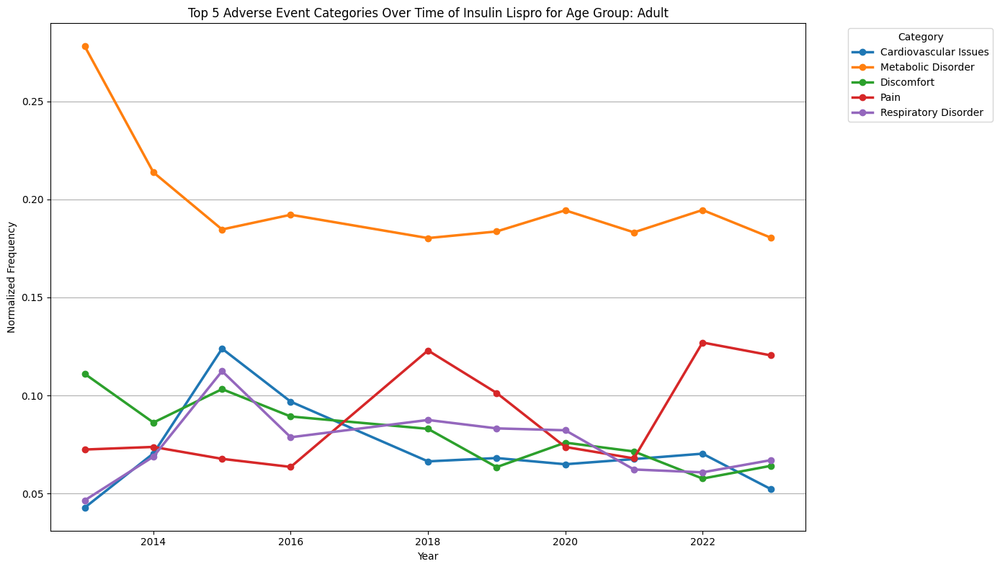

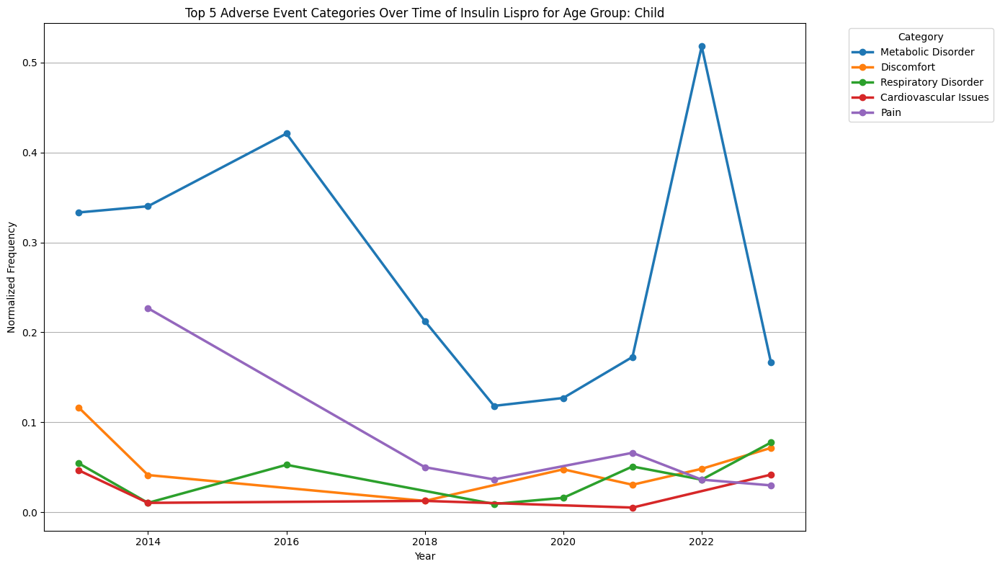

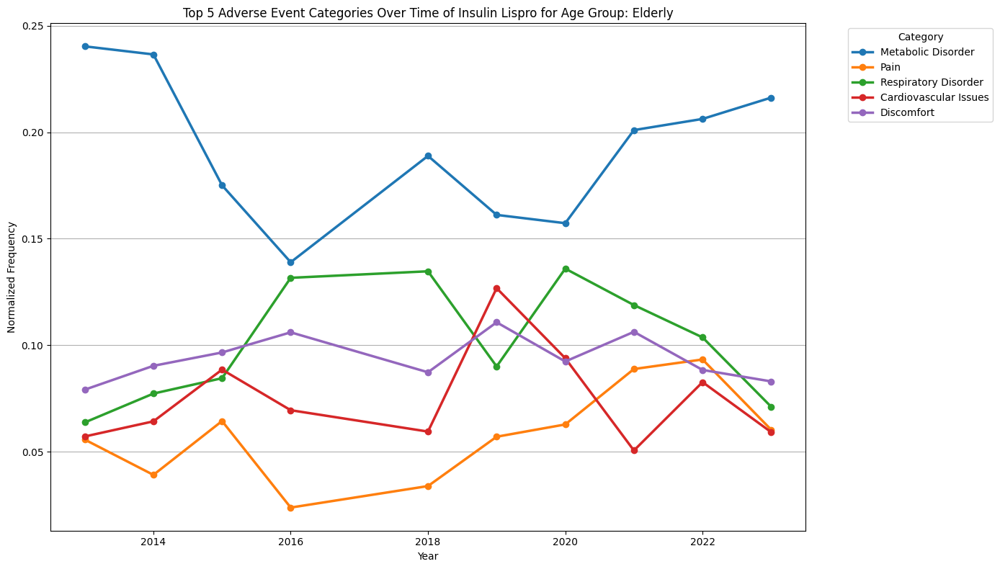

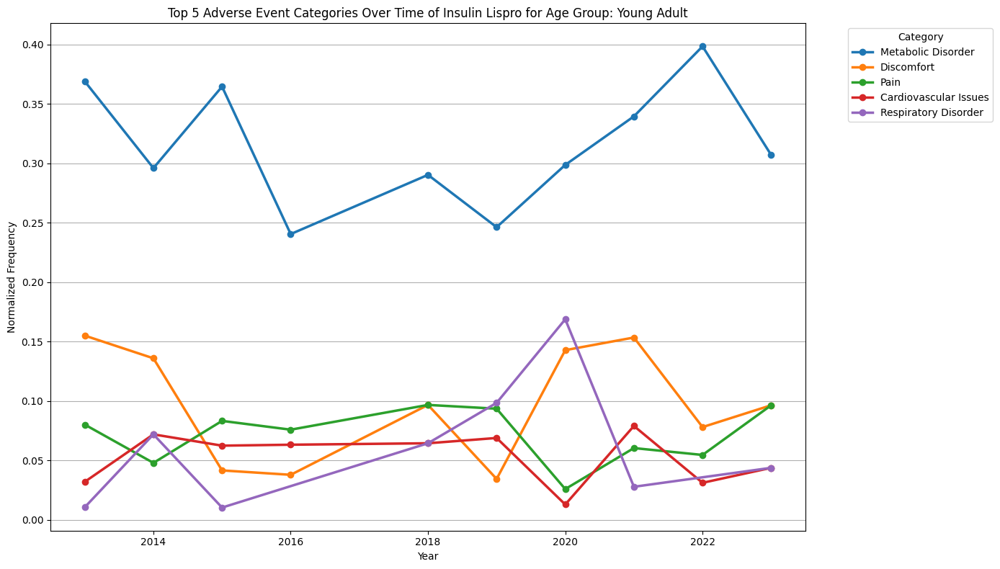

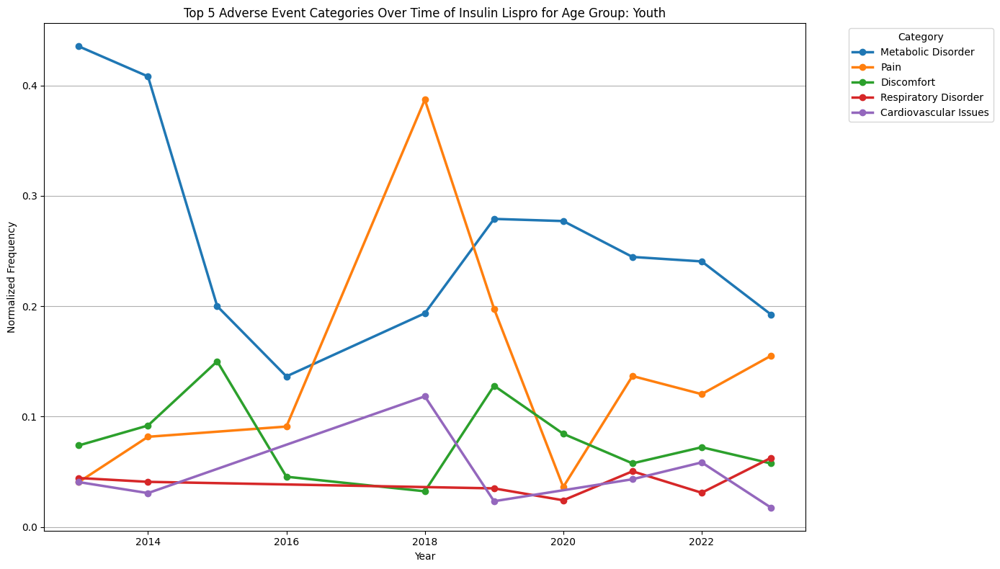

Table of Adverse Events and Their Frequency

Age Group: Adult
                    Category  Frequency  Percentage
13        Metabolic Disorder       3748   19.765847
19                      Pain       1728    9.112963
4                 Discomfort       1449    7.641599
20      Respiratory Disorder       1368    7.214429
1      Cardiovascular Issues       1266    6.676511
3         Digestive Disorder       1132    5.969834
21           Skin Conditions       1017    5.363358
10           Kidney Disorder       1004    5.294800
0             Blood Disorder        998    5.263158
8        Infectious Disorder        947    4.994199
15  Musculoskeletal Disorder        540    2.847801
12           Mental Disorder        500    2.636853
16                    Nausea        475    2.505010
18     Neurological Disorder        435    2.294062
11            Liver Disorder        414    2.183314
28           Weight Disorder        384    2.025103
27           Visual Disorder        365    1.924902
25

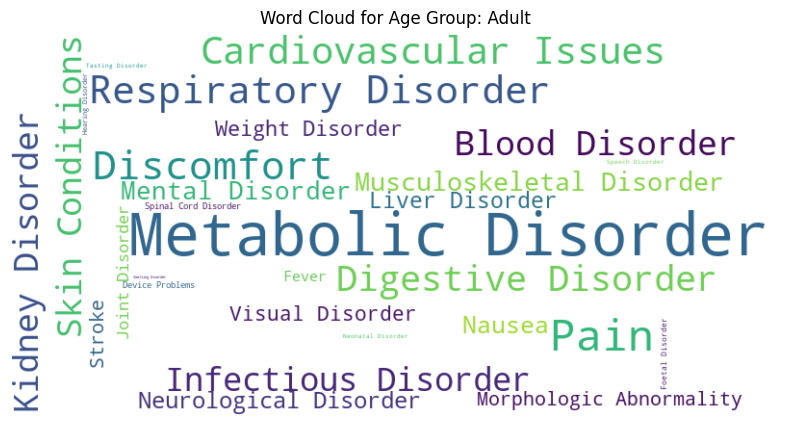

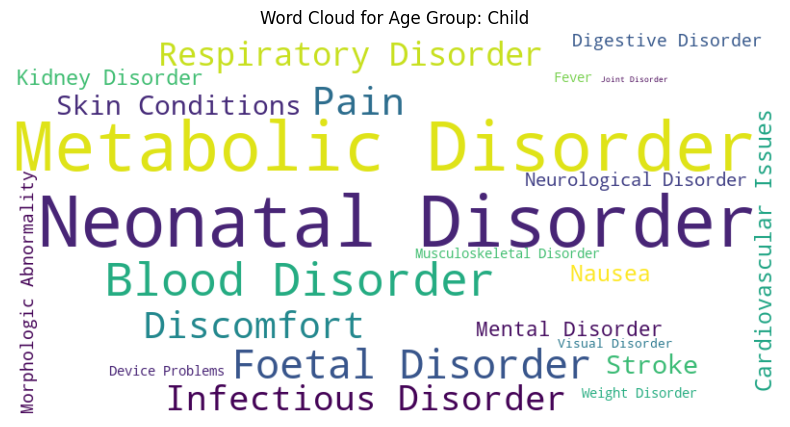

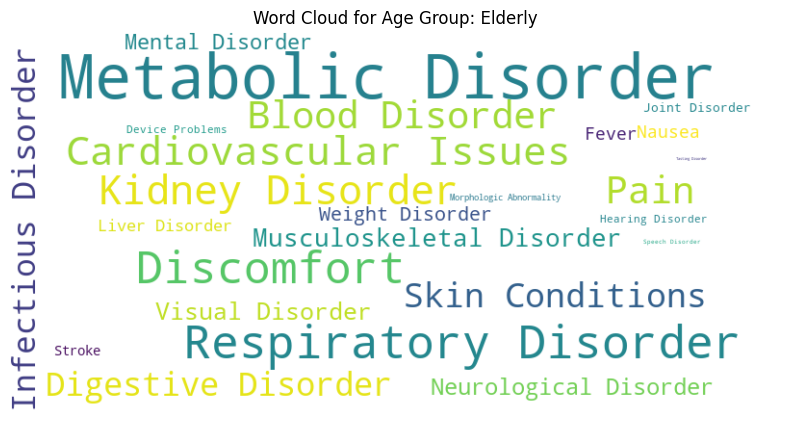

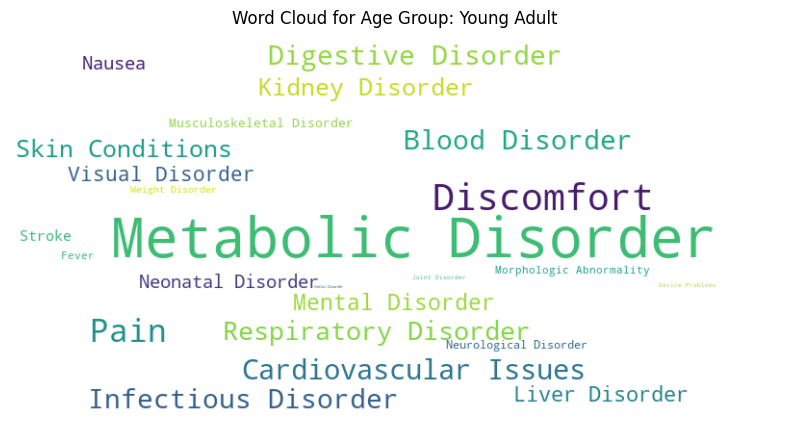

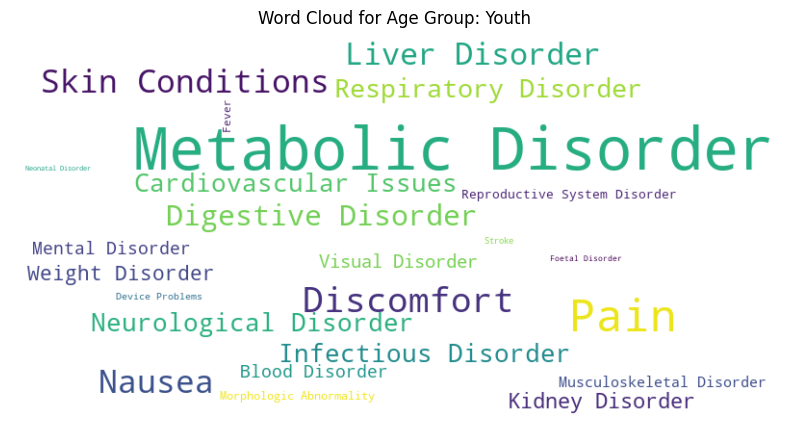

In [6]:
### INSULIN LISPRO ADVERSE EVENTS

# Create a reverse lookup dictionary from keywords to categories
category_keywords = {keyword: category for category, keywords in custom_AE_categories.items() for keyword in keywords}

# Preprocessing function
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    tokens = [word.lower() for word in word_tokenize(text) if word.isalpha() and word.lower() not in stop_words]
    return tokens

# Function to generate N-grams
def generate_ngrams(tokens, n=1):
    n_grams = list(ngrams(tokens, n))
    return [' '.join(gram) for gram in n_grams]

# Function to categorize N-grams
def categorize_ngrams(ngrams, category_keywords):
    categories = [category_keywords[ngram] for ngram in ngrams if ngram in category_keywords]
    return categories

# Initialize a dictionary for overall category frequencies by year and age group
category_counter_by_year_age_group = defaultdict(lambda: defaultdict(Counter))

# Define the path pattern for quarterly datasets from 2013 to 2023
base_path = '../Datasets/Yearly datasets/drugs reac age group/insulin_lispro'
file_pattern = os.path.join(base_path, 'insulin_lispro_reac_demo_*.csv')

# Get the list of file paths and sort them by year
file_paths = sorted(glob.glob(file_pattern), key=lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0]))

# Loop through each sorted file
for file_path in file_paths:
    print(f"Processing file: {file_path}")
    
    # Extract year from the file name (assuming the year is in the file name)
    year = int(os.path.basename(file_path).split('_')[-1].split('.')[0])

    # Load the CSV file
    file_df = pd.read_csv(file_path)
    
    # Convert the 'pt' column to lowercase and preprocess
    file_df['pt'] = file_df['pt'].str.lower()

    # Tokenize and generate N-grams for the pt column
    file_df['tokens'] = file_df['pt'].apply(preprocess_text)
    file_df['unigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 1))
    file_df['bigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 2))
    file_df['trigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 3))
    file_df['fourgrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 4))

    # Combine unigrams, bigrams, trigrams, and fourgrams into one column
    file_df['all_ngrams'] = file_df['unigrams'] + file_df['bigrams'] + file_df['trigrams'] + file_df['fourgrams']

    # Apply categorization function to the all_ngrams column
    file_df['categories'] = file_df['all_ngrams'].apply(lambda x: categorize_ngrams(x, category_keywords))

    # Process by age group and year
    for age_group, group_df in file_df.groupby('age_group'):
        # Count frequency of each category for this age group and year
        category_counter = Counter()
        for category_list in group_df['categories']:
            category_counter.update(category_list)
        
        # Update the overall category counter for this age group and year
        category_counter_by_year_age_group[year][age_group].update(category_counter)

# Convert the category counters to a DataFrame for visualization
category_data = []

for year, age_group_data in category_counter_by_year_age_group.items():
    for age_group, counter in age_group_data.items():
        total_events = sum(counter.values())
        for category, count in counter.items():
            category_data.append({
                'Year': year,
                'Age Group': age_group,
                'Category': category,
                'Count': count,
                'Normalized Count': count / total_events
            })

category_df = pd.DataFrame(category_data)

# Identify the top 5 categories overall for plotting the line chart
top_categories_overall = category_df.groupby('Category')['Count'].sum().nlargest(5).index

# Filter the DataFrame for only the top 5 categories for line chart
category_df_top = category_df[category_df['Category'].isin(top_categories_overall)]

# Plot line charts for each age group for the top 5 categories
for age_group in category_df_top['Age Group'].unique():
    age_group_df = category_df_top[category_df_top['Age Group'] == age_group]
    
    plt.figure(figsize=(14, 8))
    
    for category in age_group_df['Category'].unique():
        category_df_filtered = age_group_df[age_group_df['Category'] == category]
        plt.plot(category_df_filtered['Year'], category_df_filtered['Normalized Count'], marker='o', label=category, linewidth=2.5)
    
    plt.title(f'Top 5 Adverse Event Categories Over Time of Insulin Lispro for Age Group: {age_group}')
    plt.xlabel('Year')
    plt.ylabel('Normalized Frequency')
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()


# Display the table of adverse events and their frequency
print("Table of Adverse Events and Their Frequency")
for age_group in category_df['Age Group'].unique():
    print(f"\nAge Group: {age_group}")
    age_group_df = category_df[category_df['Age Group'] == age_group]
    table = age_group_df.pivot_table(index='Year', columns='Category', values='Count', aggfunc='sum', fill_value=0)
    total_frequencies = table.sum().reset_index()
    total_frequencies.columns = ['Category', 'Frequency']
    total_frequencies['Percentage'] = (total_frequencies['Frequency'] / total_frequencies['Frequency'].sum()) * 100
    total_frequencies = total_frequencies.sort_values(by='Frequency', ascending=False)
    total_frequencies = total_frequencies[['Category', 'Frequency', 'Percentage']]
    print(total_frequencies)

# Generate and display word clouds for all adverse events
for age_group in category_df['Age Group'].unique():
    age_group_df = category_df[category_df['Age Group'] == age_group]
    
    # Sum counts for all categories
    wordcloud_data = age_group_df.groupby('Category')['Count'].sum().to_dict()
    
    # Create and display word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Age Group: {age_group}')
    plt.show()

Processing file: ../Datasets/Yearly datasets/drugs reac age group/nph_insulin/nph_insulin_reac_demo_2013.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/nph_insulin/nph_insulin_reac_demo_2014.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/nph_insulin/nph_insulin_reac_demo_2015.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/nph_insulin/nph_insulin_reac_demo_2016.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/nph_insulin/nph_insulin_reac_demo_2017.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/nph_insulin/nph_insulin_reac_demo_2018.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/nph_insulin/nph_insulin_reac_demo_2019.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/nph_insulin/nph_insulin_reac_demo_2020.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/nph_insulin/nph_insulin_reac_demo_2021.csv
Processing file: ..

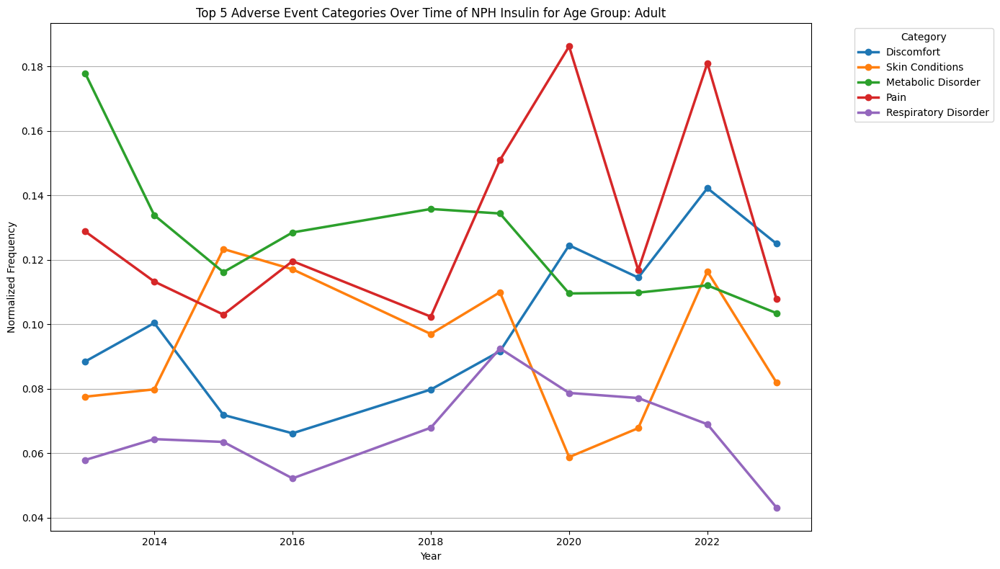

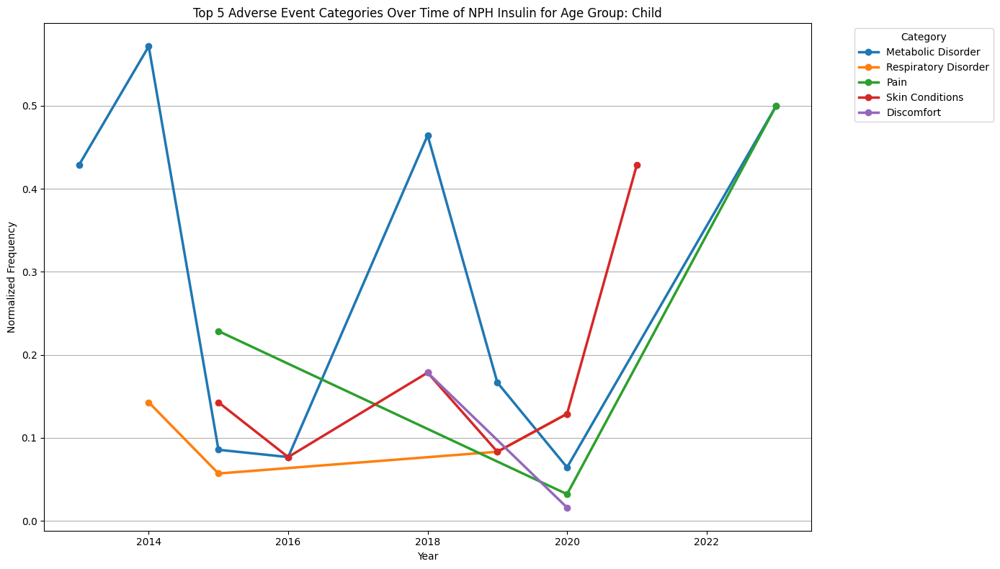

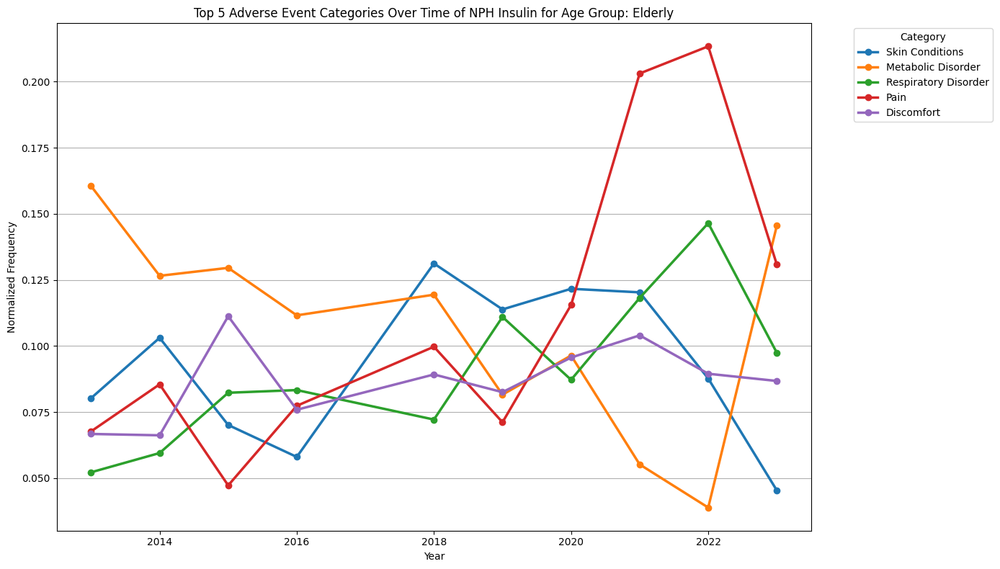

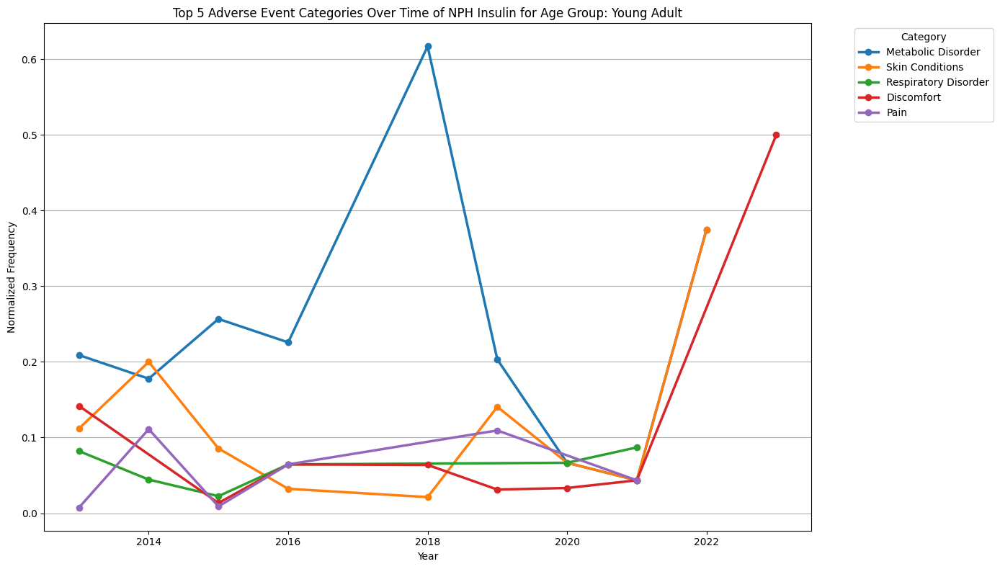

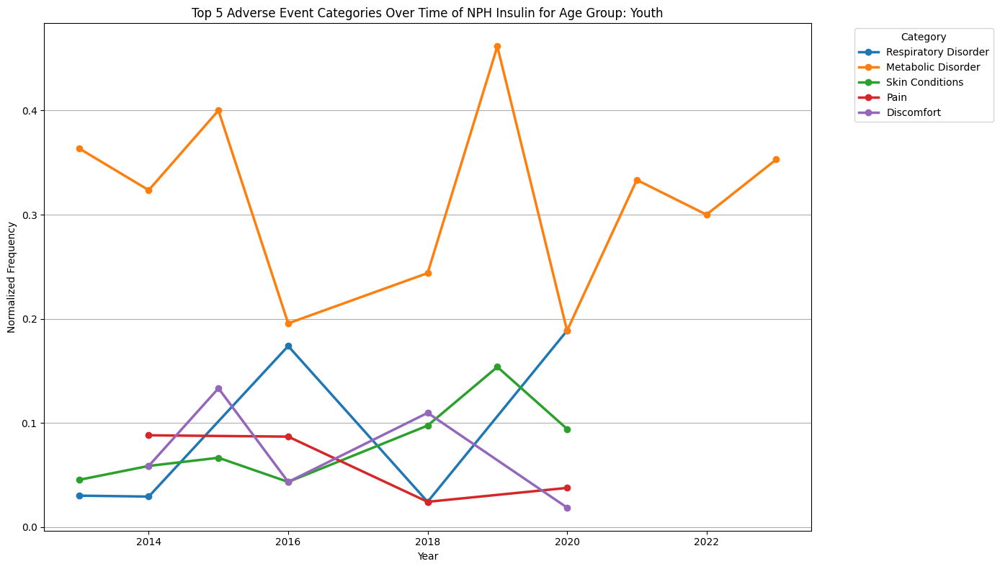

Table of Adverse Events and Their Frequency

Age Group: Adult
                    Category  Frequency  Percentage
19                      Pain        958   13.152114
13        Metabolic Disorder        952   13.069742
4                 Discomfort        686    9.417902
21           Skin Conditions        678    9.308072
0             Blood Disorder        507    6.960461
20      Respiratory Disorder        504    6.919275
1      Cardiovascular Issues        438    6.013180
8        Infectious Disorder        384    5.271829
3         Digestive Disorder        364    4.997254
15  Musculoskeletal Disorder        274    3.761669
10           Kidney Disorder        265    3.638111
18     Neurological Disorder        226    3.102691
12           Mental Disorder        158    2.169138
25           Visual Disorder        152    2.086766
16                    Nausea        144    1.976936
11            Liver Disorder        100    1.372872
9             Joint Disorder         97    1.331686
26

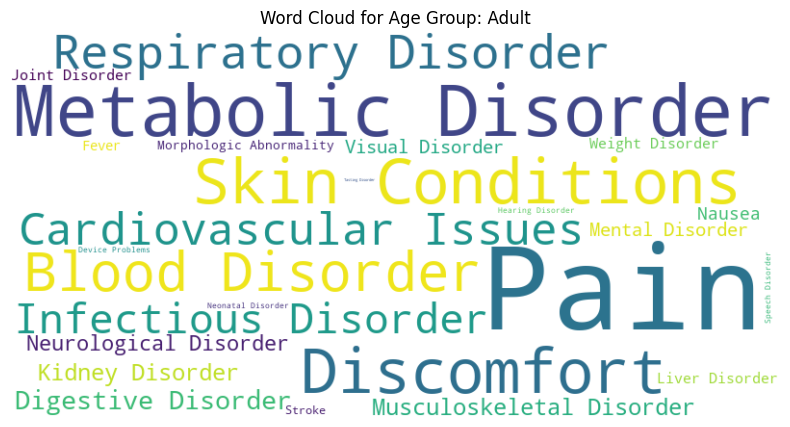

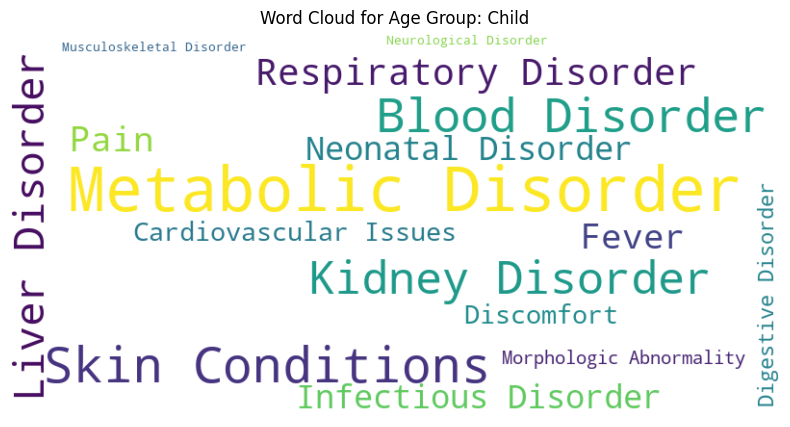

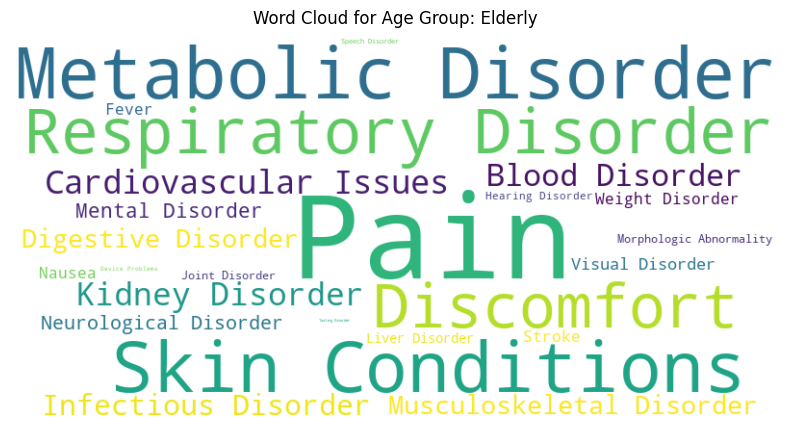

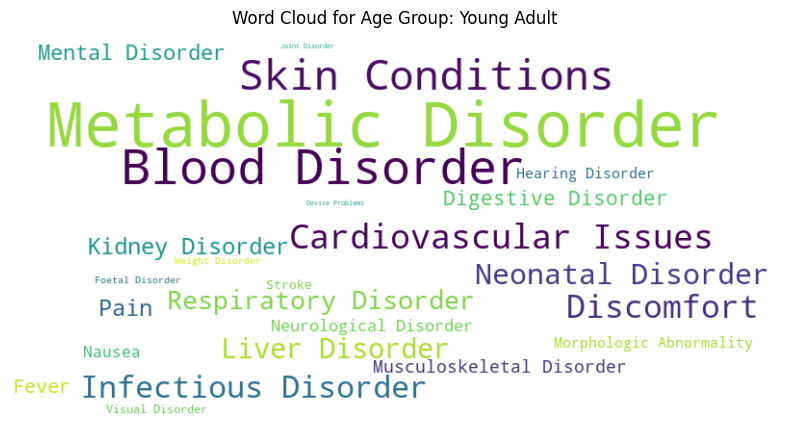

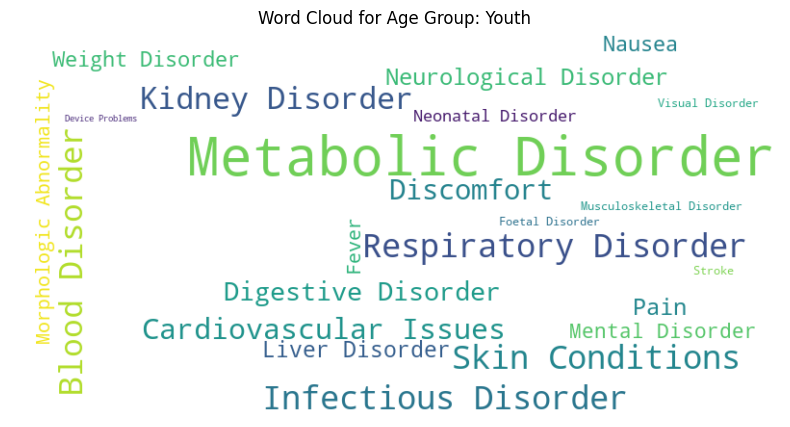

In [7]:
### NPH INSULIN

# Create a reverse lookup dictionary from keywords to categories
category_keywords = {keyword: category for category, keywords in custom_AE_categories.items() for keyword in keywords}

# Preprocessing function
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    tokens = [word.lower() for word in word_tokenize(text) if word.isalpha() and word.lower() not in stop_words]
    return tokens

# Function to generate N-grams
def generate_ngrams(tokens, n=1):
    n_grams = list(ngrams(tokens, n))
    return [' '.join(gram) for gram in n_grams]

# Function to categorize N-grams
def categorize_ngrams(ngrams, category_keywords):
    categories = [category_keywords[ngram] for ngram in ngrams if ngram in category_keywords]
    return categories

# Initialize a dictionary for overall category frequencies by year and age group
category_counter_by_year_age_group = defaultdict(lambda: defaultdict(Counter))

# Define the path pattern for quarterly datasets from 2013 to 2023
base_path = '../Datasets/Yearly datasets/drugs reac age group/nph_insulin'
file_pattern = os.path.join(base_path, 'nph_insulin_reac_demo_*.csv')

# Get the list of file paths and sort them by year
file_paths = sorted(glob.glob(file_pattern), key=lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0]))

# Loop through each sorted file
for file_path in file_paths:
    print(f"Processing file: {file_path}")
    
    # Extract year from the file name (assuming the year is in the file name)
    year = int(os.path.basename(file_path).split('_')[-1].split('.')[0])

    # Load the CSV file
    file_df = pd.read_csv(file_path)
    
    # Convert the 'pt' column to lowercase and preprocess
    file_df['pt'] = file_df['pt'].str.lower()

    # Tokenize and generate N-grams for the pt column
    file_df['tokens'] = file_df['pt'].apply(preprocess_text)
    file_df['unigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 1))
    file_df['bigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 2))
    file_df['trigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 3))
    file_df['fourgrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 4))

    # Combine unigrams, bigrams, trigrams, and fourgrams into one column
    file_df['all_ngrams'] = file_df['unigrams'] + file_df['bigrams'] + file_df['trigrams'] + file_df['fourgrams']

    # Apply categorization function to the all_ngrams column
    file_df['categories'] = file_df['all_ngrams'].apply(lambda x: categorize_ngrams(x, category_keywords))

    # Process by age group and year
    for age_group, group_df in file_df.groupby('age_group'):
        # Count frequency of each category for this age group and year
        category_counter = Counter()
        for category_list in group_df['categories']:
            category_counter.update(category_list)
        
        # Update the overall category counter for this age group and year
        category_counter_by_year_age_group[year][age_group].update(category_counter)

# Convert the category counters to a DataFrame for visualization
category_data = []

for year, age_group_data in category_counter_by_year_age_group.items():
    for age_group, counter in age_group_data.items():
        total_events = sum(counter.values())
        for category, count in counter.items():
            category_data.append({
                'Year': year,
                'Age Group': age_group,
                'Category': category,
                'Count': count,
                'Normalized Count': count / total_events
            })

category_df = pd.DataFrame(category_data)

# Identify the top 5 categories overall for plotting the line chart
top_categories_overall = category_df.groupby('Category')['Count'].sum().nlargest(5).index

# Filter the DataFrame for only the top 5 categories for line chart
category_df_top = category_df[category_df['Category'].isin(top_categories_overall)]

# Plot line charts for each age group for the top 5 categories
for age_group in category_df_top['Age Group'].unique():
    age_group_df = category_df_top[category_df_top['Age Group'] == age_group]
    
    plt.figure(figsize=(14, 8))
    
    for category in age_group_df['Category'].unique():
        category_df_filtered = age_group_df[age_group_df['Category'] == category]
        plt.plot(category_df_filtered['Year'], category_df_filtered['Normalized Count'], marker='o', label=category, linewidth=2.5)
    
    plt.title(f'Top 5 Adverse Event Categories Over Time of NPH Insulin for Age Group: {age_group}')
    plt.xlabel('Year')
    plt.ylabel('Normalized Frequency')
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()


# Display the table of adverse events and their frequency
print("Table of Adverse Events and Their Frequency")
for age_group in category_df['Age Group'].unique():
    print(f"\nAge Group: {age_group}")
    age_group_df = category_df[category_df['Age Group'] == age_group]
    table = age_group_df.pivot_table(index='Year', columns='Category', values='Count', aggfunc='sum', fill_value=0)
    total_frequencies = table.sum().reset_index()
    total_frequencies.columns = ['Category', 'Frequency']
    total_frequencies['Percentage'] = (total_frequencies['Frequency'] / total_frequencies['Frequency'].sum()) * 100
    total_frequencies = total_frequencies.sort_values(by='Frequency', ascending=False)
    total_frequencies = total_frequencies[['Category', 'Frequency', 'Percentage']]
    print(total_frequencies)

# Generate and display word clouds for all adverse events
for age_group in category_df['Age Group'].unique():
    age_group_df = category_df[category_df['Age Group'] == age_group]
    
    # Sum counts for all categories
    wordcloud_data = age_group_df.groupby('Category')['Count'].sum().to_dict()
    
    # Create and display word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Age Group: {age_group}')
    plt.show()

Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_glargine/insulin_glargine_reac_demo_2013.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_glargine/insulin_glargine_reac_demo_2014.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_glargine/insulin_glargine_reac_demo_2015.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_glargine/insulin_glargine_reac_demo_2016.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_glargine/insulin_glargine_reac_demo_2017.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_glargine/insulin_glargine_reac_demo_2018.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_glargine/insulin_glargine_reac_demo_2019.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/insulin_glargine/insulin_glargine_reac_demo_2020.csv
Processing file: ../Datasets/Yearly datasets/dru

/var/folders/ld/dl450hd568j5wxpfd5d84y340000gn/T/ipykernel_8093/1140216551.py:41: DtypeWarning: Columns (10,12,23) have mixed types. Specify dtype option on import or set low_memory=False.
  file_df = pd.read_csv(file_path)


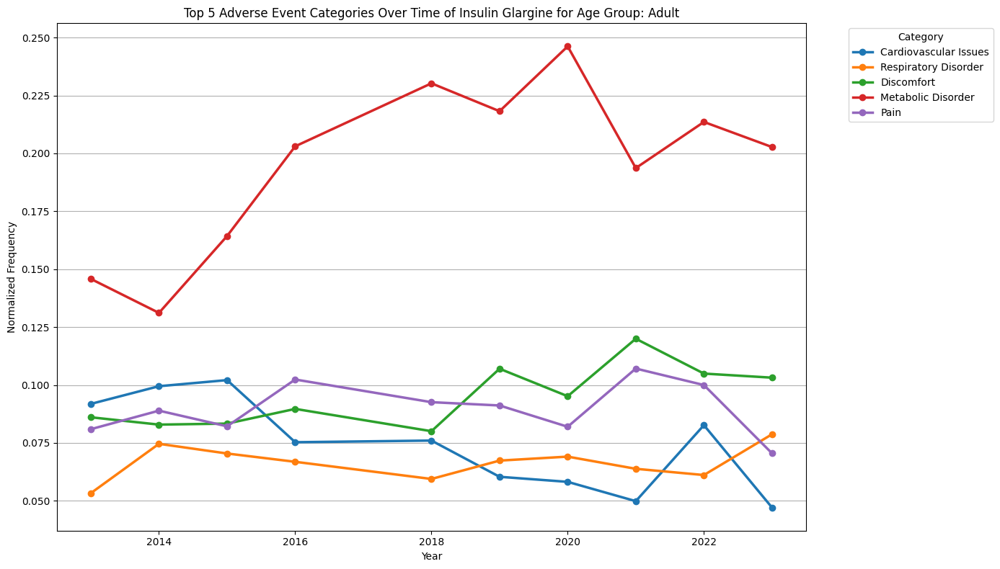

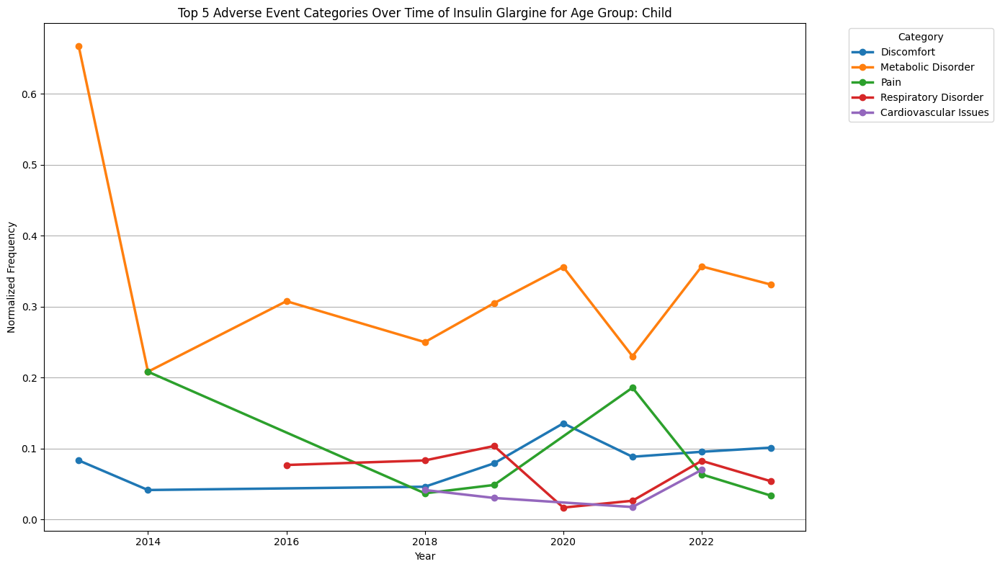

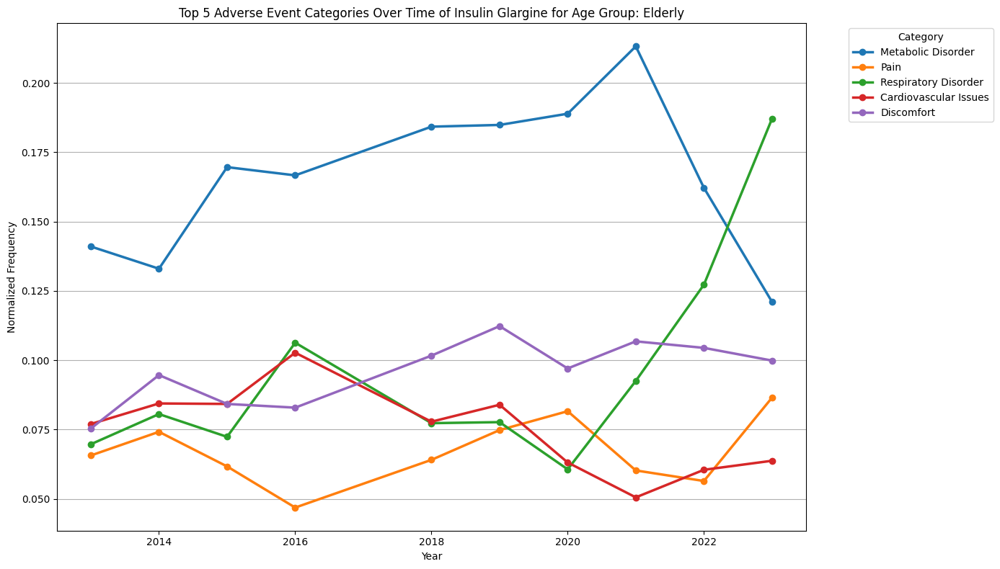

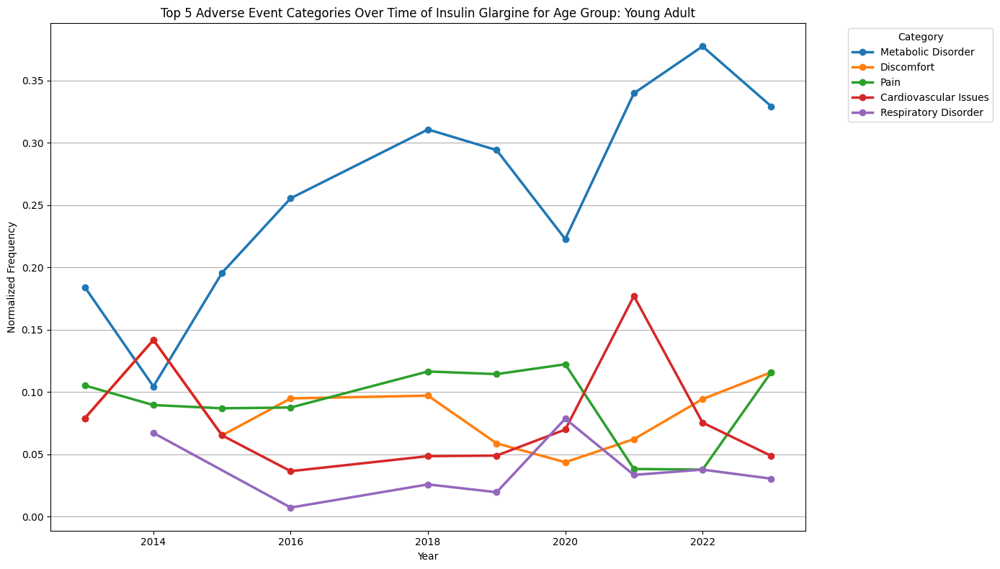

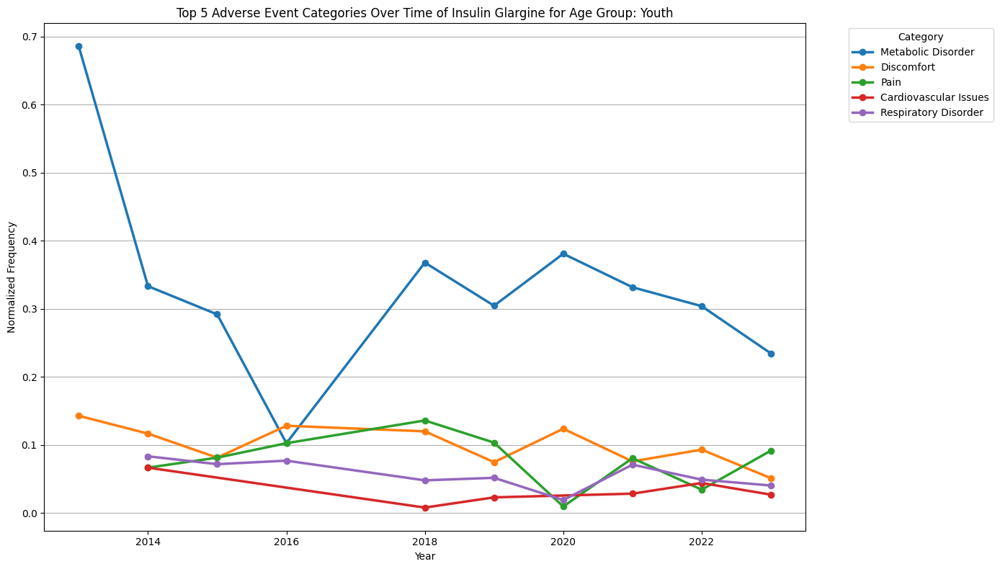

Table of Adverse Events and Their Frequency

Age Group: Adult
                        Category  Frequency  Percentage
12            Metabolic Disorder       6760   20.882889
4                     Discomfort       3208    9.910105
18                          Pain       2926    9.038955
1          Cardiovascular Issues       2178    6.728244
20          Respiratory Disorder       2143    6.620123
9                Kidney Disorder       1983    6.125853
3             Digestive Disorder       1948    6.017732
21               Skin Conditions       1681    5.192920
7            Infectious Disorder       1626    5.023014
0                 Blood Disorder       1465    4.525656
11               Mental Disorder       1223    3.778073
14      Musculoskeletal Disorder        947    2.925458
15                        Nausea        750    2.316889
17         Neurological Disorder        704    2.174786
27               Visual Disorder        644    1.989435
28               Weight Disorder        61

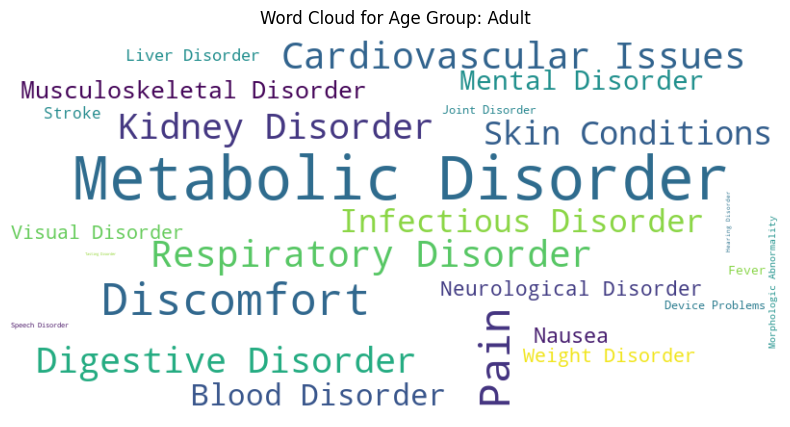

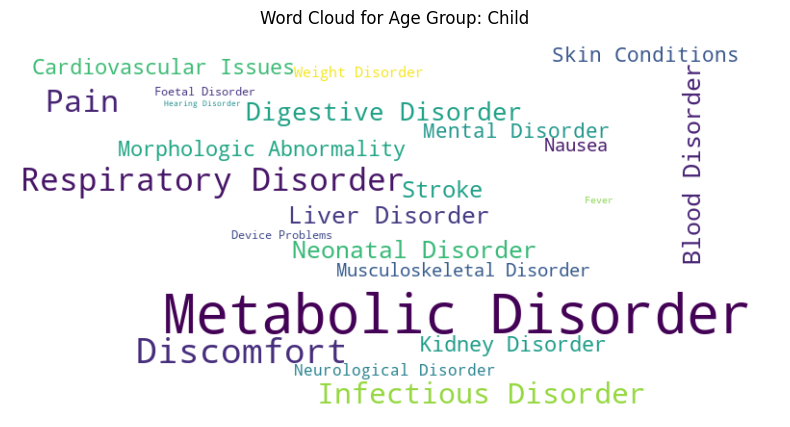

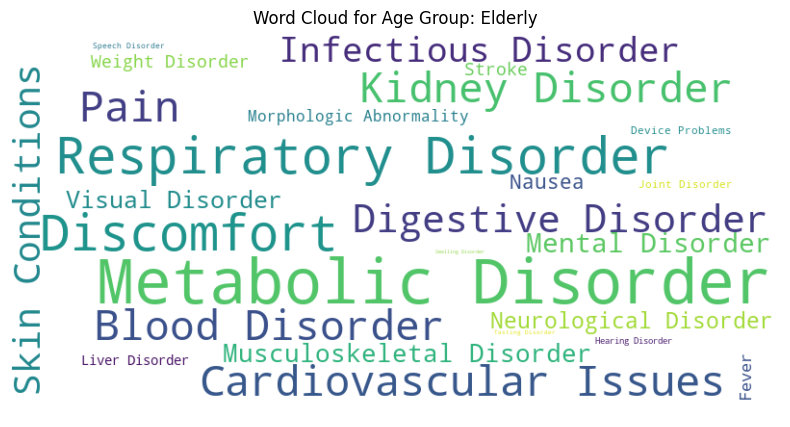

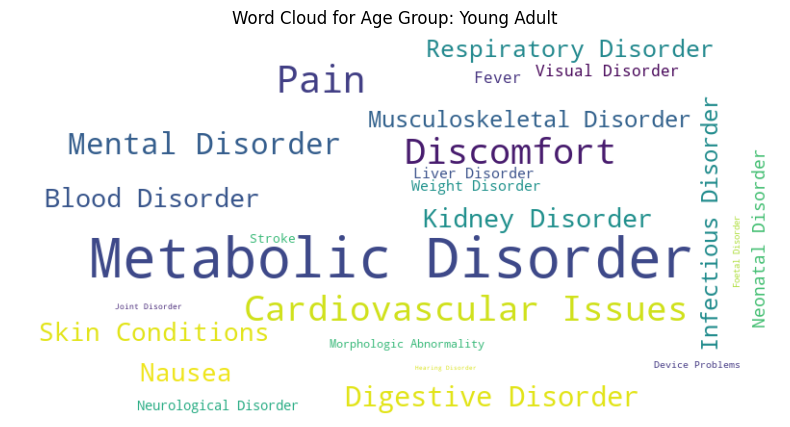

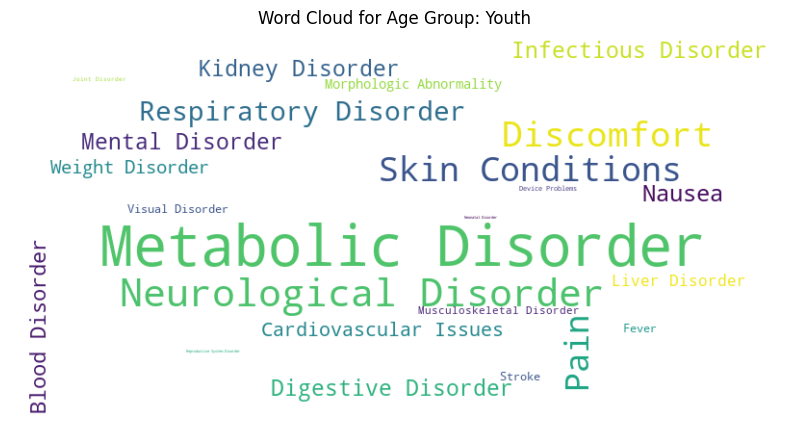

In [8]:
### INSULIN GLARGINE

# Create a reverse lookup dictionary from keywords to categories
category_keywords = {keyword: category for category, keywords in custom_AE_categories.items() for keyword in keywords}

# Preprocessing function
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    tokens = [word.lower() for word in word_tokenize(text) if word.isalpha() and word.lower() not in stop_words]
    return tokens

# Function to generate N-grams
def generate_ngrams(tokens, n=1):
    n_grams = list(ngrams(tokens, n))
    return [' '.join(gram) for gram in n_grams]

# Function to categorize N-grams
def categorize_ngrams(ngrams, category_keywords):
    categories = [category_keywords[ngram] for ngram in ngrams if ngram in category_keywords]
    return categories

# Initialize a dictionary for overall category frequencies by year and age group
category_counter_by_year_age_group = defaultdict(lambda: defaultdict(Counter))

# Define the path pattern for quarterly datasets from 2013 to 2023
base_path = '../Datasets/Yearly datasets/drugs reac age group/insulin_glargine'
file_pattern = os.path.join(base_path, 'insulin_glargine_reac_demo_*.csv')

# Get the list of file paths and sort them by year
file_paths = sorted(glob.glob(file_pattern), key=lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0]))

# Loop through each sorted file
for file_path in file_paths:
    print(f"Processing file: {file_path}")
    
    # Extract year from the file name (assuming the year is in the file name)
    year = int(os.path.basename(file_path).split('_')[-1].split('.')[0])

    # Load the CSV file
    file_df = pd.read_csv(file_path)
    
    # Convert the 'pt' column to lowercase and preprocess
    file_df['pt'] = file_df['pt'].str.lower()

    # Tokenize and generate N-grams for the pt column
    file_df['tokens'] = file_df['pt'].apply(preprocess_text)
    file_df['unigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 1))
    file_df['bigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 2))
    file_df['trigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 3))
    file_df['fourgrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 4))

    # Combine unigrams, bigrams, trigrams, and fourgrams into one column
    file_df['all_ngrams'] = file_df['unigrams'] + file_df['bigrams'] + file_df['trigrams'] + file_df['fourgrams']

    # Apply categorization function to the all_ngrams column
    file_df['categories'] = file_df['all_ngrams'].apply(lambda x: categorize_ngrams(x, category_keywords))

    # Process by age group and year
    for age_group, group_df in file_df.groupby('age_group'):
        # Count frequency of each category for this age group and year
        category_counter = Counter()
        for category_list in group_df['categories']:
            category_counter.update(category_list)
        
        # Update the overall category counter for this age group and year
        category_counter_by_year_age_group[year][age_group].update(category_counter)

# Convert the category counters to a DataFrame for visualization
category_data = []

for year, age_group_data in category_counter_by_year_age_group.items():
    for age_group, counter in age_group_data.items():
        total_events = sum(counter.values())
        for category, count in counter.items():
            category_data.append({
                'Year': year,
                'Age Group': age_group,
                'Category': category,
                'Count': count,
                'Normalized Count': count / total_events
            })

category_df = pd.DataFrame(category_data)

# Identify the top 5 categories overall for plotting the line chart
top_categories_overall = category_df.groupby('Category')['Count'].sum().nlargest(5).index

# Filter the DataFrame for only the top 5 categories for line chart
category_df_top = category_df[category_df['Category'].isin(top_categories_overall)]

# Plot line charts for each age group for the top 5 categories
for age_group in category_df_top['Age Group'].unique():
    age_group_df = category_df_top[category_df_top['Age Group'] == age_group]
    
    plt.figure(figsize=(14, 8))
    
    for category in age_group_df['Category'].unique():
        category_df_filtered = age_group_df[age_group_df['Category'] == category]
        plt.plot(category_df_filtered['Year'], category_df_filtered['Normalized Count'], marker='o', label=category, linewidth=2.5)
    
    plt.title(f'Top 5 Adverse Event Categories Over Time of Insulin Glargine for Age Group: {age_group}')
    plt.xlabel('Year')
    plt.ylabel('Normalized Frequency')
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()


# Display the table of adverse events and their frequency
print("Table of Adverse Events and Their Frequency")
for age_group in category_df['Age Group'].unique():
    print(f"\nAge Group: {age_group}")
    age_group_df = category_df[category_df['Age Group'] == age_group]
    table = age_group_df.pivot_table(index='Year', columns='Category', values='Count', aggfunc='sum', fill_value=0)
    total_frequencies = table.sum().reset_index()
    total_frequencies.columns = ['Category', 'Frequency']
    total_frequencies['Percentage'] = (total_frequencies['Frequency'] / total_frequencies['Frequency'].sum()) * 100
    total_frequencies = total_frequencies.sort_values(by='Frequency', ascending=False)
    total_frequencies = total_frequencies[['Category', 'Frequency', 'Percentage']]
    print(total_frequencies)

# Generate and display word clouds for all adverse events
for age_group in category_df['Age Group'].unique():
    age_group_df = category_df[category_df['Age Group'] == age_group]
    
    # Sum counts for all categories
    wordcloud_data = age_group_df.groupby('Category')['Count'].sum().to_dict()
    
    # Create and display word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Age Group: {age_group}')
    plt.show()

Processing file: ../Datasets/Yearly datasets/drugs reac age group/canagliflozin/canagliflozin_reac_demo_2013.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/canagliflozin/canagliflozin_reac_demo_2014.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/canagliflozin/canagliflozin_reac_demo_2015.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/canagliflozin/canagliflozin_reac_demo_2016.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/canagliflozin/canagliflozin_reac_demo_2017.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/canagliflozin/canagliflozin_reac_demo_2018.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/canagliflozin/canagliflozin_reac_demo_2019.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/canagliflozin/canagliflozin_reac_demo_2020.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/canagliflozin/canagliflozin_re

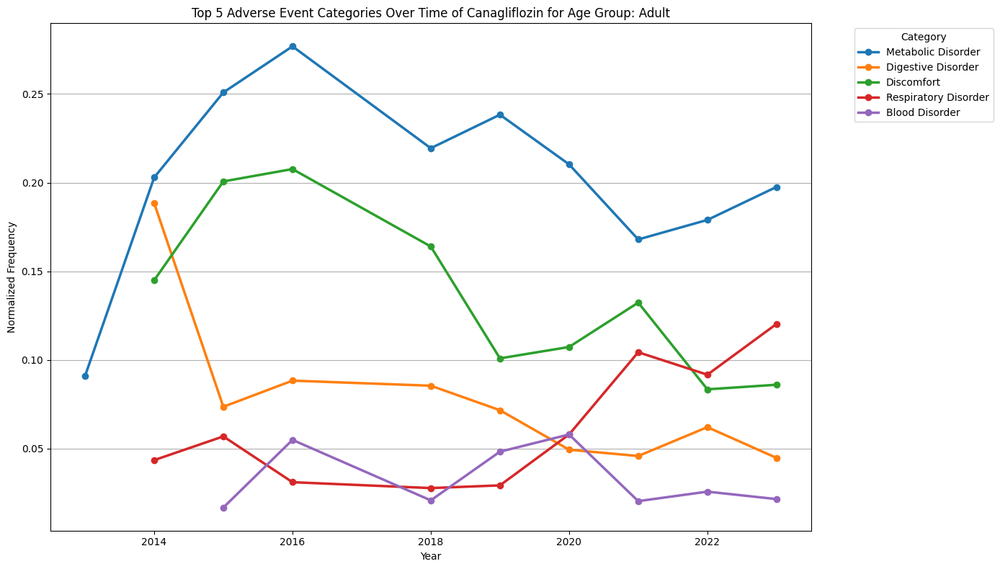

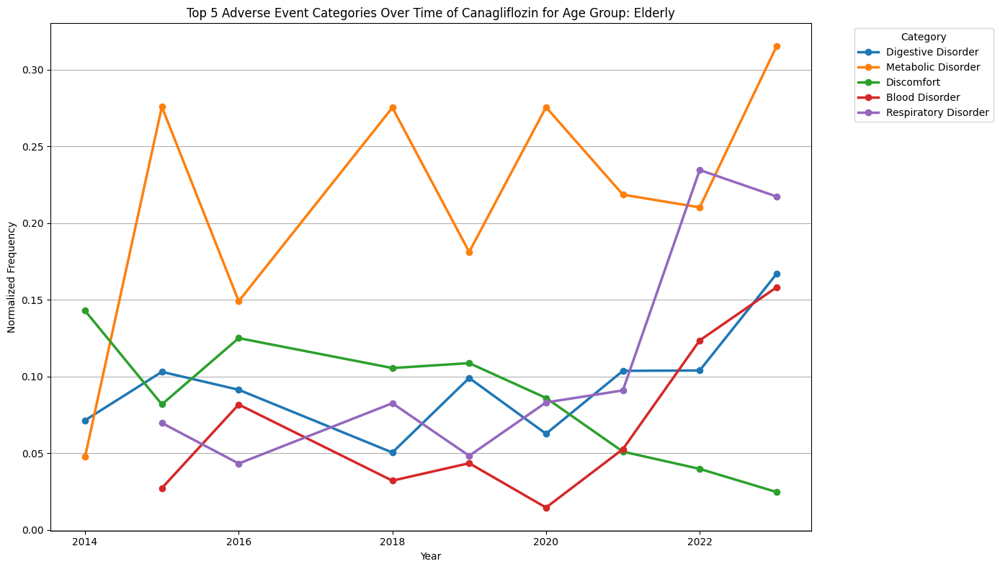

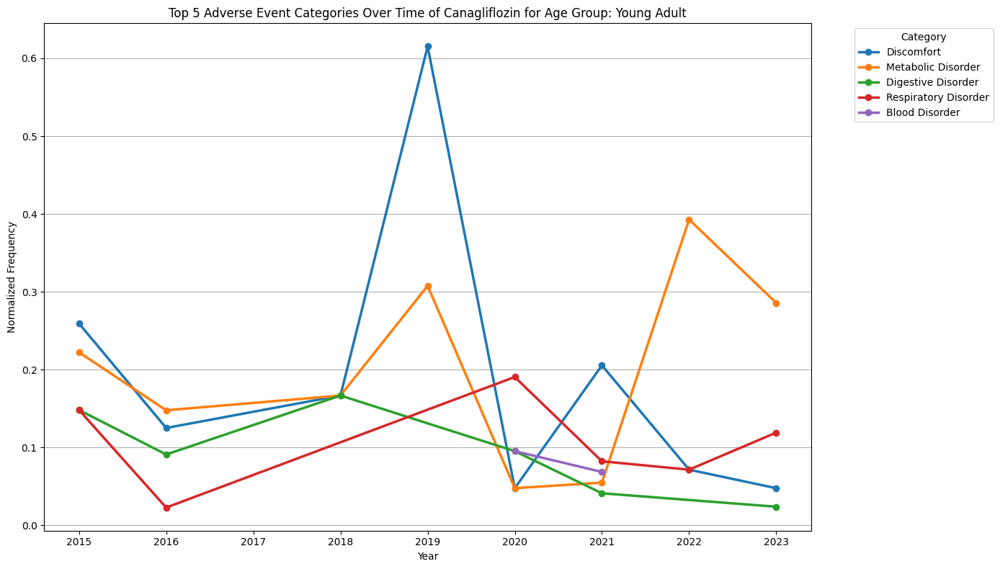

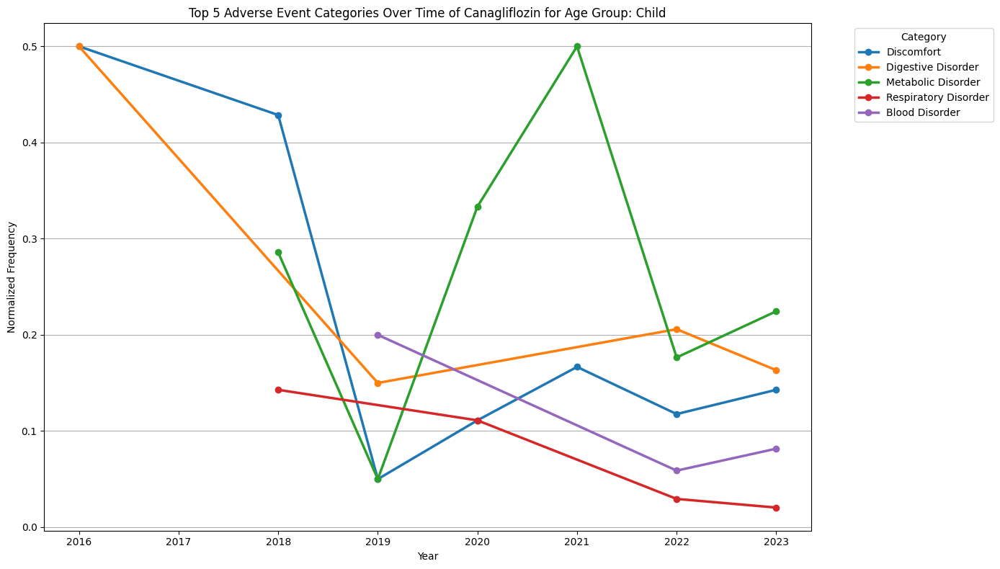

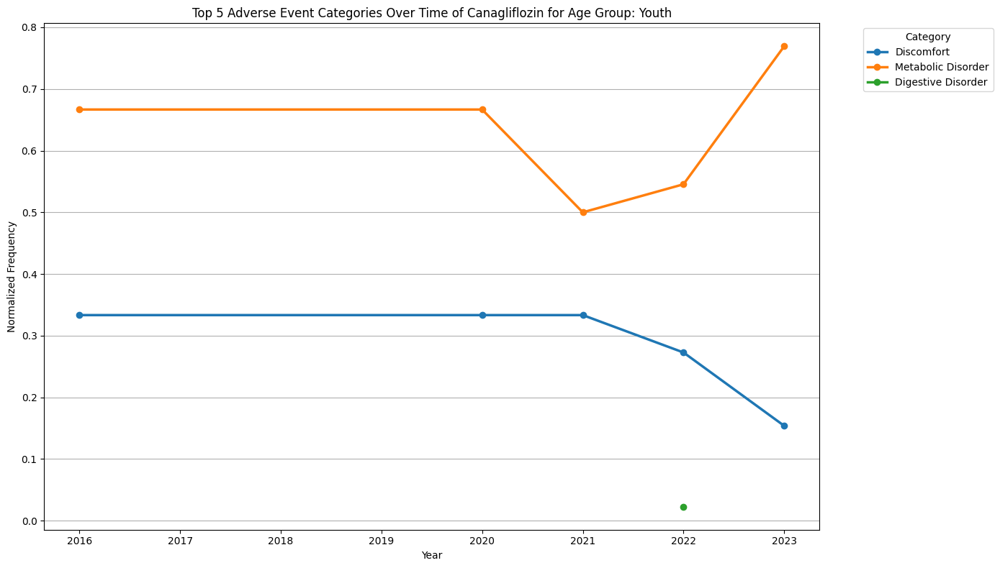

Table of Adverse Events and Their Frequency

Age Group: Adult
                    Category  Frequency  Percentage
12        Metabolic Disorder       1338   20.371498
4                 Discomfort        719   10.947016
19      Respiratory Disorder        529    8.054202
18                      Pain        478    7.277710
7        Infectious Disorder        438    6.668697
3         Digestive Disorder        404    6.151035
20           Skin Conditions        351    5.344093
8             Joint Disorder        344    5.237515
9            Kidney Disorder        293    4.461023
1      Cardiovascular Issues        267    4.065164
11           Mental Disorder        260    3.958587
15                    Nausea        201    3.060292
10            Liver Disorder        199    3.029842
0             Blood Disorder        195    2.968940
14  Musculoskeletal Disorder        150    2.283800
26           Weight Disorder        112    1.705238
13   Morphologic Abnormality         78    1.187576
6 

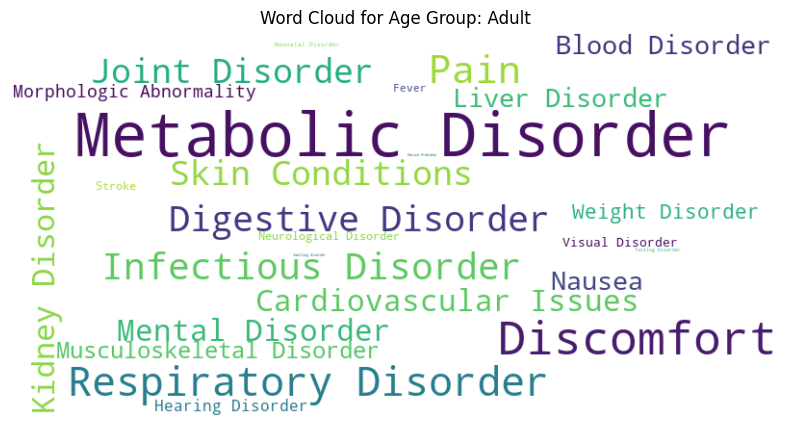

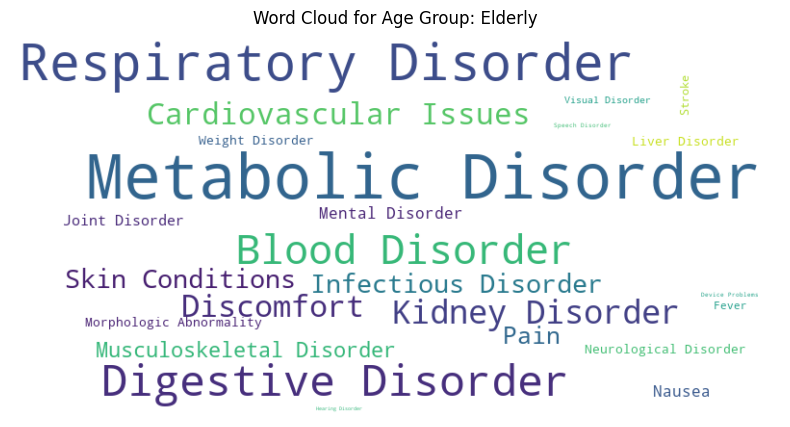

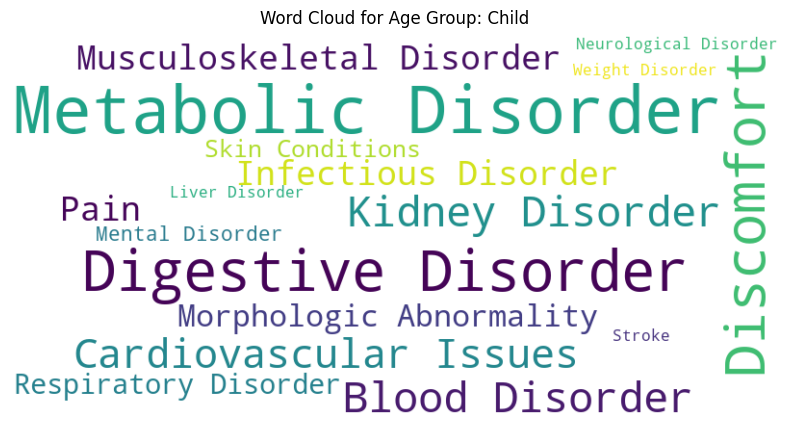

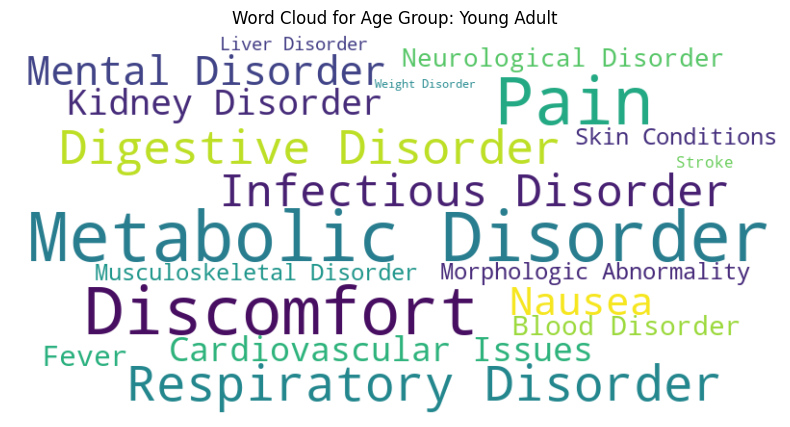

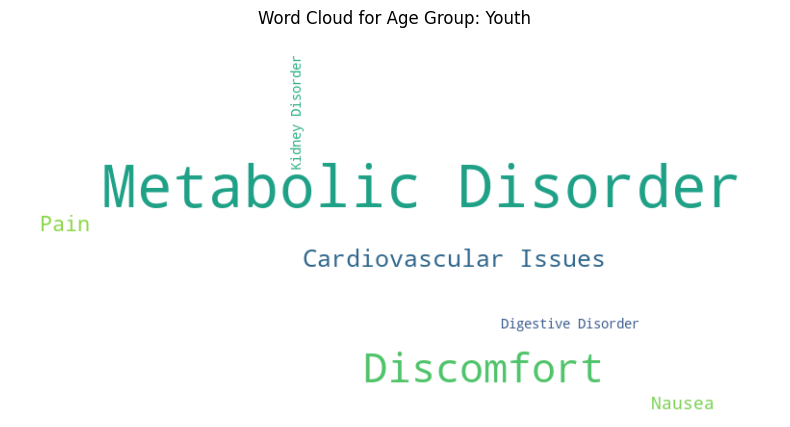

In [9]:
### CANAGLIFLOZIN

# Create a reverse lookup dictionary from keywords to categories
category_keywords = {keyword: category for category, keywords in custom_AE_categories.items() for keyword in keywords}

# Preprocessing function
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    tokens = [word.lower() for word in word_tokenize(text) if word.isalpha() and word.lower() not in stop_words]
    return tokens

# Function to generate N-grams
def generate_ngrams(tokens, n=1):
    n_grams = list(ngrams(tokens, n))
    return [' '.join(gram) for gram in n_grams]

# Function to categorize N-grams
def categorize_ngrams(ngrams, category_keywords):
    categories = [category_keywords[ngram] for ngram in ngrams if ngram in category_keywords]
    return categories

# Initialize a dictionary for overall category frequencies by year and age group
category_counter_by_year_age_group = defaultdict(lambda: defaultdict(Counter))

# Define the path pattern for quarterly datasets from 2013 to 2023
base_path = '../Datasets/Yearly datasets/drugs reac age group/canagliflozin'
file_pattern = os.path.join(base_path, 'canagliflozin_reac_demo_*.csv')

# Get the list of file paths and sort them by year
file_paths = sorted(glob.glob(file_pattern), key=lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0]))

# Loop through each sorted file
for file_path in file_paths:
    print(f"Processing file: {file_path}")
    
    # Extract year from the file name (assuming the year is in the file name)
    year = int(os.path.basename(file_path).split('_')[-1].split('.')[0])

    # Load the CSV file
    file_df = pd.read_csv(file_path)
    
    # Convert the 'pt' column to lowercase and preprocess
    file_df['pt'] = file_df['pt'].str.lower()

    # Tokenize and generate N-grams for the pt column
    file_df['tokens'] = file_df['pt'].apply(preprocess_text)
    file_df['unigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 1))
    file_df['bigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 2))
    file_df['trigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 3))
    file_df['fourgrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 4))

    # Combine unigrams, bigrams, trigrams, and fourgrams into one column
    file_df['all_ngrams'] = file_df['unigrams'] + file_df['bigrams'] + file_df['trigrams'] + file_df['fourgrams']

    # Apply categorization function to the all_ngrams column
    file_df['categories'] = file_df['all_ngrams'].apply(lambda x: categorize_ngrams(x, category_keywords))

    # Process by age group and year
    for age_group, group_df in file_df.groupby('age_group'):
        # Count frequency of each category for this age group and year
        category_counter = Counter()
        for category_list in group_df['categories']:
            category_counter.update(category_list)
        
        # Update the overall category counter for this age group and year
        category_counter_by_year_age_group[year][age_group].update(category_counter)

# Convert the category counters to a DataFrame for visualization
category_data = []

for year, age_group_data in category_counter_by_year_age_group.items():
    for age_group, counter in age_group_data.items():
        total_events = sum(counter.values())
        for category, count in counter.items():
            category_data.append({
                'Year': year,
                'Age Group': age_group,
                'Category': category,
                'Count': count,
                'Normalized Count': count / total_events
            })

category_df = pd.DataFrame(category_data)

# Identify the top 5 categories overall for plotting the line chart
top_categories_overall = category_df.groupby('Category')['Count'].sum().nlargest(5).index

# Filter the DataFrame for only the top 5 categories for line chart
category_df_top = category_df[category_df['Category'].isin(top_categories_overall)]

# Plot line charts for each age group for the top 5 categories
for age_group in category_df_top['Age Group'].unique():
    age_group_df = category_df_top[category_df_top['Age Group'] == age_group]
    
    plt.figure(figsize=(14, 8))
    
    for category in age_group_df['Category'].unique():
        category_df_filtered = age_group_df[age_group_df['Category'] == category]
        plt.plot(category_df_filtered['Year'], category_df_filtered['Normalized Count'], marker='o', label=category, linewidth=2.5)
    
    plt.title(f'Top 5 Adverse Event Categories Over Time of Canagliflozin for Age Group: {age_group}')
    plt.xlabel('Year')
    plt.ylabel('Normalized Frequency')
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()


# Display the table of adverse events and their frequency
print("Table of Adverse Events and Their Frequency")
for age_group in category_df['Age Group'].unique():
    print(f"\nAge Group: {age_group}")
    age_group_df = category_df[category_df['Age Group'] == age_group]
    table = age_group_df.pivot_table(index='Year', columns='Category', values='Count', aggfunc='sum', fill_value=0)
    total_frequencies = table.sum().reset_index()
    total_frequencies.columns = ['Category', 'Frequency']
    total_frequencies['Percentage'] = (total_frequencies['Frequency'] / total_frequencies['Frequency'].sum()) * 100
    total_frequencies = total_frequencies.sort_values(by='Frequency', ascending=False)
    total_frequencies = total_frequencies[['Category', 'Frequency', 'Percentage']]
    print(total_frequencies)

# Generate and display word clouds for all adverse events
for age_group in category_df['Age Group'].unique():
    age_group_df = category_df[category_df['Age Group'] == age_group]
    
    # Sum counts for all categories
    wordcloud_data = age_group_df.groupby('Category')['Count'].sum().to_dict()
    
    # Create and display word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Age Group: {age_group}')
    plt.show()

Processing file: ../Datasets/Yearly datasets/drugs reac age group/dapagliflozin/dapagliflozin_reac_demo_2013.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dapagliflozin/dapagliflozin_reac_demo_2014.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dapagliflozin/dapagliflozin_reac_demo_2015.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dapagliflozin/dapagliflozin_reac_demo_2016.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dapagliflozin/dapagliflozin_reac_demo_2017.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dapagliflozin/dapagliflozin_reac_demo_2018.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dapagliflozin/dapagliflozin_reac_demo_2019.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dapagliflozin/dapagliflozin_reac_demo_2020.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dapagliflozin/dapagliflozin_re

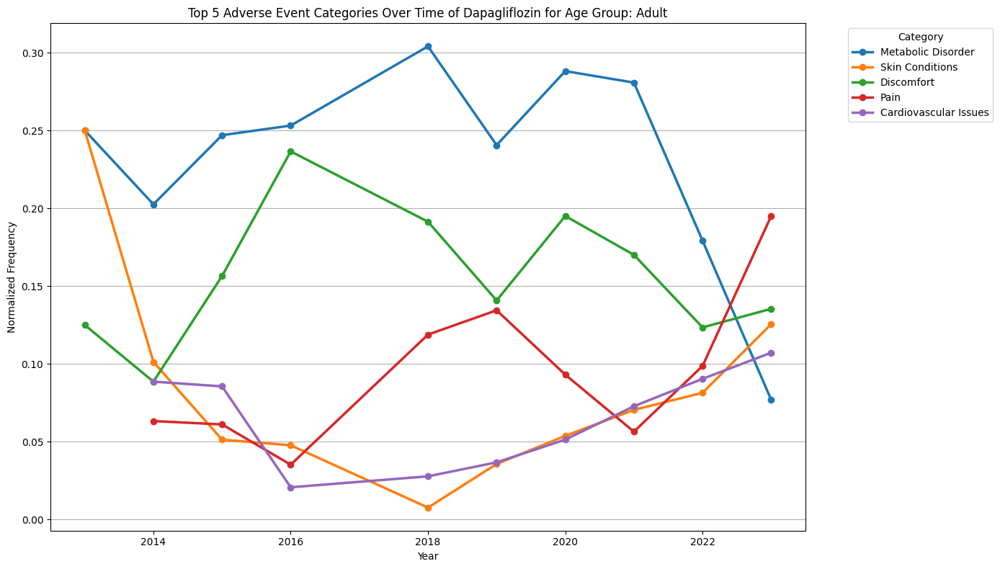

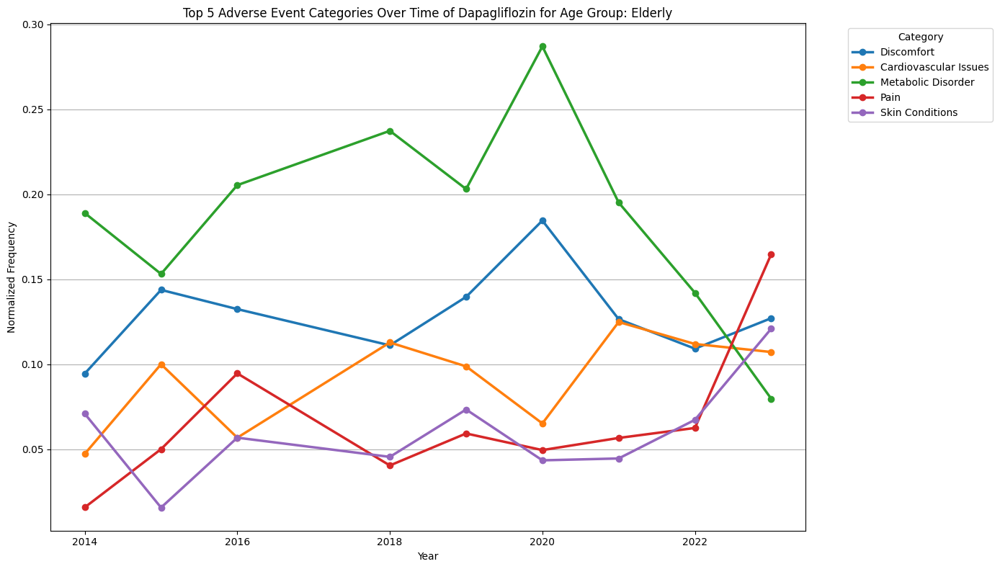

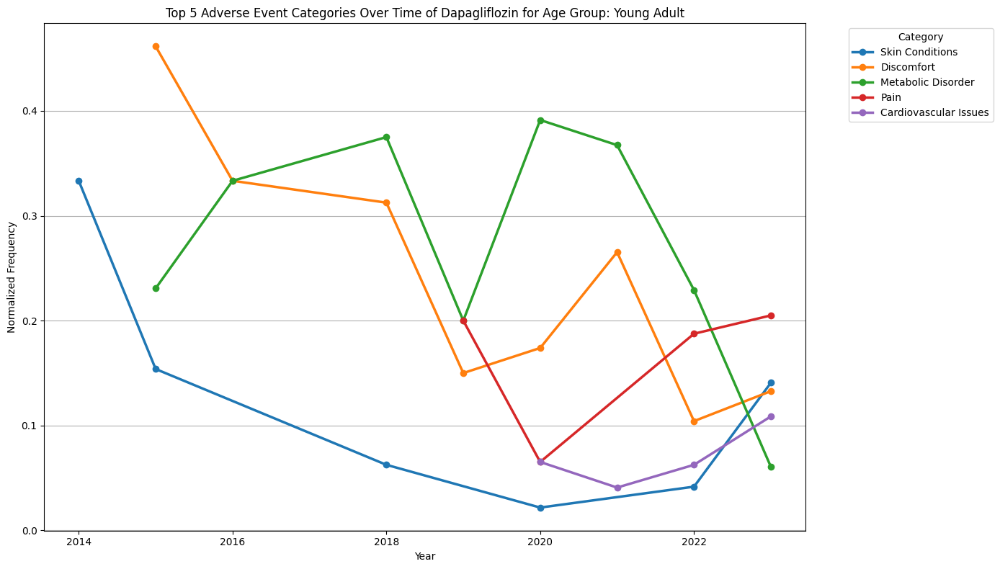

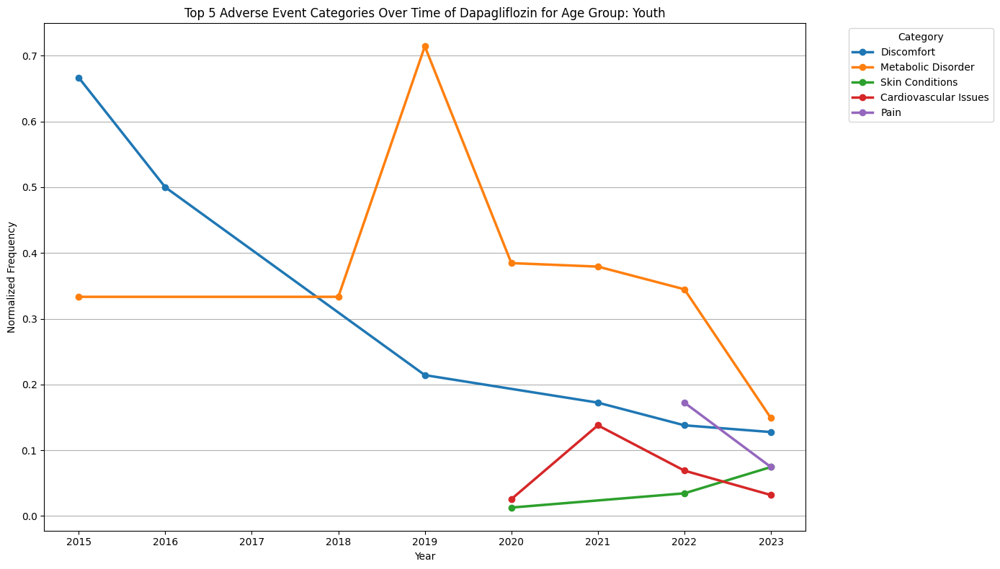

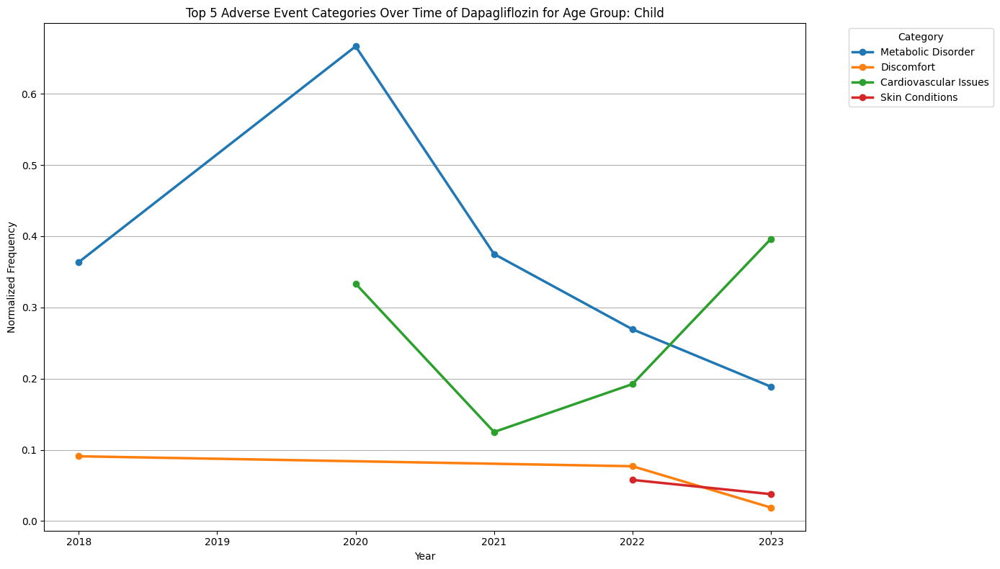

Table of Adverse Events and Their Frequency

Age Group: Adult
                        Category  Frequency  Percentage
17                          Pain       4405   15.821421
4                     Discomfort       3948   14.180016
12            Metabolic Disorder       3658   13.138424
20               Skin Conditions       2895   10.397960
1          Cardiovascular Issues       2613    9.385102
3             Digestive Disorder       1397    5.017599
19          Respiratory Disorder       1221    4.385461
11               Mental Disorder       1083    3.889807
0                 Blood Disorder        900    3.232526
9                Kidney Disorder        858    3.081675
15                        Nausea        821    2.948782
16         Neurological Disorder        749    2.690180
25               Visual Disorder        709    2.546512
7            Infectious Disorder        535    1.921557
14      Musculoskeletal Disorder        487    1.749156
23                        Stroke        43

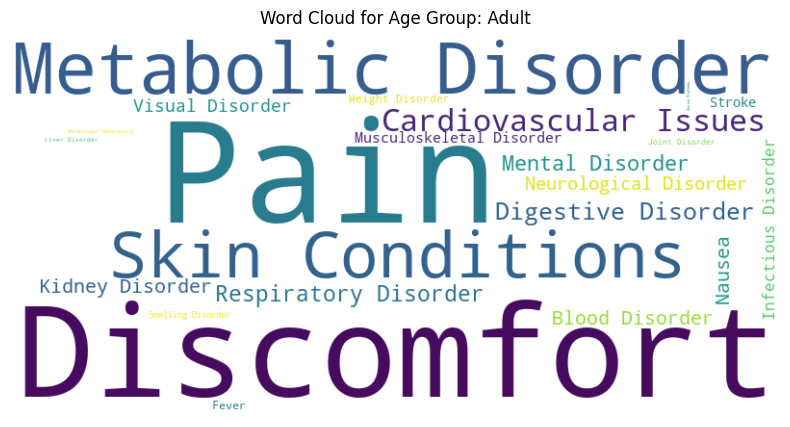

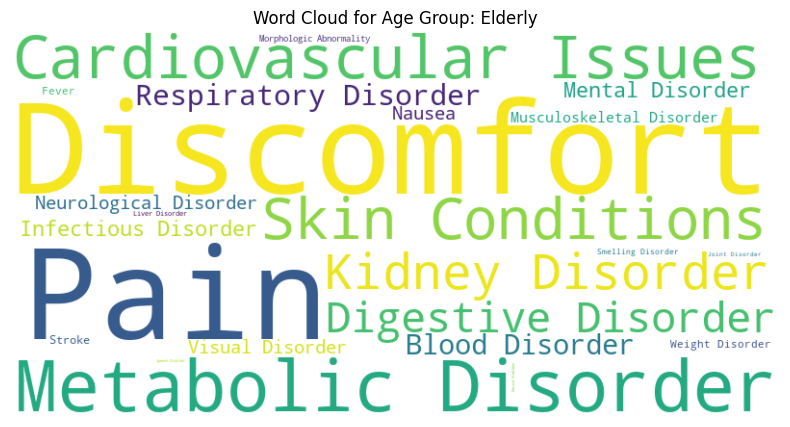

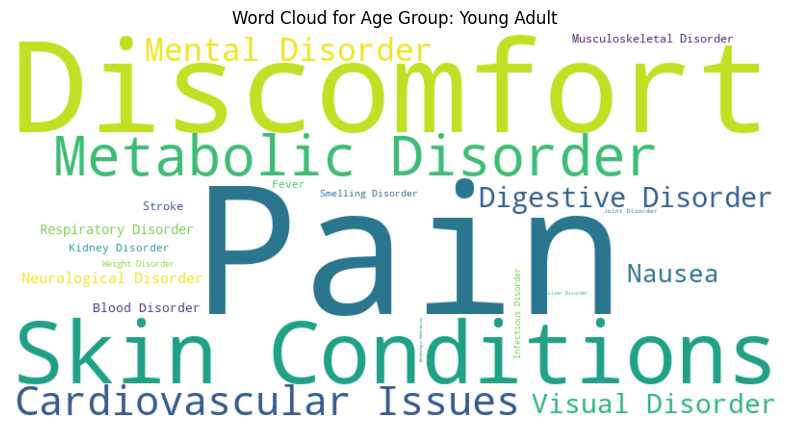

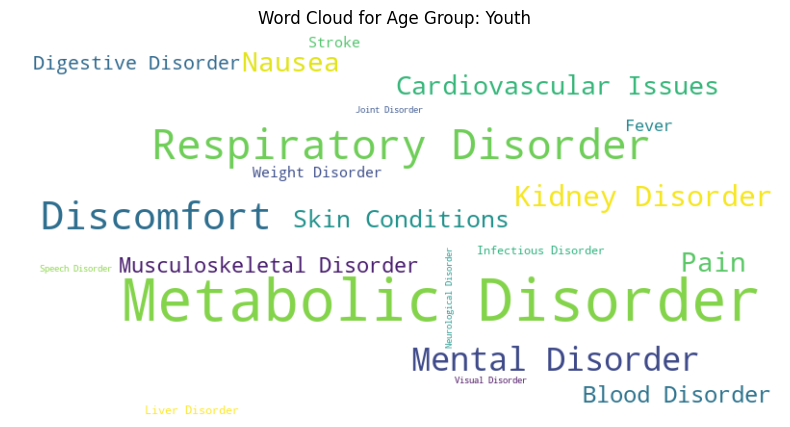

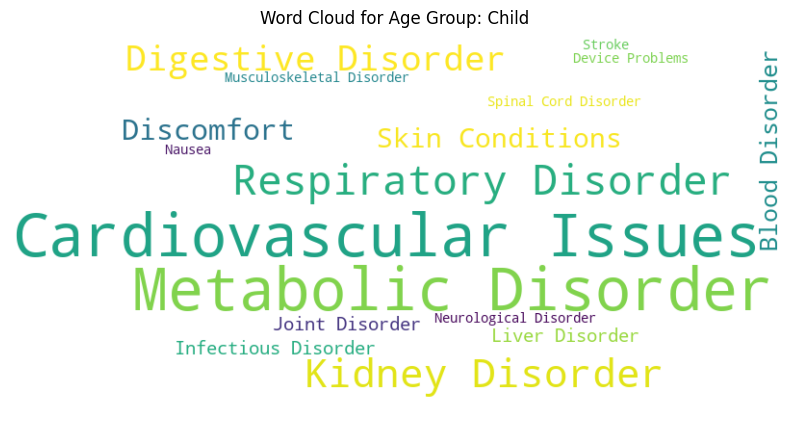

In [10]:
### DAPAGLIFLOZIN

# Create a reverse lookup dictionary from keywords to categories
category_keywords = {keyword: category for category, keywords in custom_AE_categories.items() for keyword in keywords}

# Preprocessing function
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    tokens = [word.lower() for word in word_tokenize(text) if word.isalpha() and word.lower() not in stop_words]
    return tokens

# Function to generate N-grams
def generate_ngrams(tokens, n=1):
    n_grams = list(ngrams(tokens, n))
    return [' '.join(gram) for gram in n_grams]

# Function to categorize N-grams
def categorize_ngrams(ngrams, category_keywords):
    categories = [category_keywords[ngram] for ngram in ngrams if ngram in category_keywords]
    return categories

# Initialize a dictionary for overall category frequencies by year and age group
category_counter_by_year_age_group = defaultdict(lambda: defaultdict(Counter))

# Define the path pattern for quarterly datasets from 2013 to 2023
base_path = '../Datasets/Yearly datasets/drugs reac age group/dapagliflozin'
file_pattern = os.path.join(base_path, 'dapagliflozin_reac_demo_*.csv')

# Get the list of file paths and sort them by year
file_paths = sorted(glob.glob(file_pattern), key=lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0]))

# Loop through each sorted file
for file_path in file_paths:
    print(f"Processing file: {file_path}")
    
    # Extract year from the file name (assuming the year is in the file name)
    year = int(os.path.basename(file_path).split('_')[-1].split('.')[0])

    # Load the CSV file
    file_df = pd.read_csv(file_path)
    
    # Convert the 'pt' column to lowercase and preprocess
    file_df['pt'] = file_df['pt'].str.lower()

    # Tokenize and generate N-grams for the pt column
    file_df['tokens'] = file_df['pt'].apply(preprocess_text)
    file_df['unigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 1))
    file_df['bigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 2))
    file_df['trigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 3))
    file_df['fourgrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 4))

    # Combine unigrams, bigrams, trigrams, and fourgrams into one column
    file_df['all_ngrams'] = file_df['unigrams'] + file_df['bigrams'] + file_df['trigrams'] + file_df['fourgrams']

    # Apply categorization function to the all_ngrams column
    file_df['categories'] = file_df['all_ngrams'].apply(lambda x: categorize_ngrams(x, category_keywords))

    # Process by age group and year
    for age_group, group_df in file_df.groupby('age_group'):
        # Count frequency of each category for this age group and year
        category_counter = Counter()
        for category_list in group_df['categories']:
            category_counter.update(category_list)
        
        # Update the overall category counter for this age group and year
        category_counter_by_year_age_group[year][age_group].update(category_counter)

# Convert the category counters to a DataFrame for visualization
category_data = []

for year, age_group_data in category_counter_by_year_age_group.items():
    for age_group, counter in age_group_data.items():
        total_events = sum(counter.values())
        for category, count in counter.items():
            category_data.append({
                'Year': year,
                'Age Group': age_group,
                'Category': category,
                'Count': count,
                'Normalized Count': count / total_events
            })

category_df = pd.DataFrame(category_data)

# Identify the top 5 categories overall for plotting the line chart
top_categories_overall = category_df.groupby('Category')['Count'].sum().nlargest(5).index

# Filter the DataFrame for only the top 5 categories for line chart
category_df_top = category_df[category_df['Category'].isin(top_categories_overall)]

# Plot line charts for each age group for the top 5 categories
for age_group in category_df_top['Age Group'].unique():
    age_group_df = category_df_top[category_df_top['Age Group'] == age_group]
    
    plt.figure(figsize=(14, 8))
    
    for category in age_group_df['Category'].unique():
        category_df_filtered = age_group_df[age_group_df['Category'] == category]
        plt.plot(category_df_filtered['Year'], category_df_filtered['Normalized Count'], marker='o', label=category, linewidth=2.5)
    
    plt.title(f'Top 5 Adverse Event Categories Over Time of Dapagliflozin for Age Group: {age_group}')
    plt.xlabel('Year')
    plt.ylabel('Normalized Frequency')
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()


# Display the table of adverse events and their frequency
print("Table of Adverse Events and Their Frequency")
for age_group in category_df['Age Group'].unique():
    print(f"\nAge Group: {age_group}")
    age_group_df = category_df[category_df['Age Group'] == age_group]
    table = age_group_df.pivot_table(index='Year', columns='Category', values='Count', aggfunc='sum', fill_value=0)
    total_frequencies = table.sum().reset_index()
    total_frequencies.columns = ['Category', 'Frequency']
    total_frequencies['Percentage'] = (total_frequencies['Frequency'] / total_frequencies['Frequency'].sum()) * 100
    total_frequencies = total_frequencies.sort_values(by='Frequency', ascending=False)
    total_frequencies = total_frequencies[['Category', 'Frequency', 'Percentage']]
    print(total_frequencies)

# Generate and display word clouds for all adverse events
for age_group in category_df['Age Group'].unique():
    age_group_df = category_df[category_df['Age Group'] == age_group]
    
    # Sum counts for all categories
    wordcloud_data = age_group_df.groupby('Category')['Count'].sum().to_dict()
    
    # Create and display word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Age Group: {age_group}')
    plt.show()

Processing file: ../Datasets/Yearly datasets/drugs reac age group/empagliflozin/empagliflozin_reac_demo_2013.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/empagliflozin/empagliflozin_reac_demo_2014.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/empagliflozin/empagliflozin_reac_demo_2015.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/empagliflozin/empagliflozin_reac_demo_2016.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/empagliflozin/empagliflozin_reac_demo_2017.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/empagliflozin/empagliflozin_reac_demo_2018.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/empagliflozin/empagliflozin_reac_demo_2019.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/empagliflozin/empagliflozin_reac_demo_2020.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/empagliflozin/empagliflozin_re

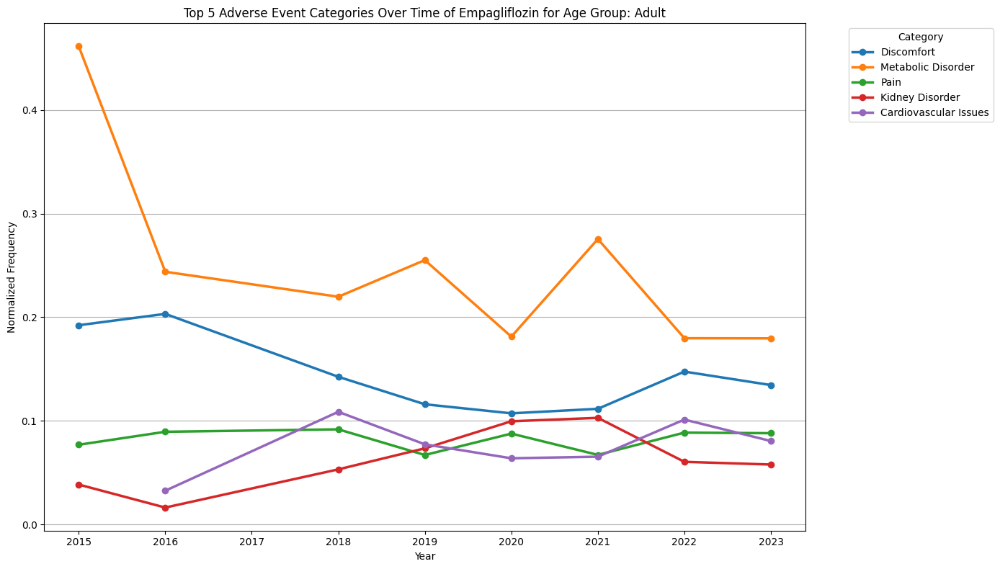

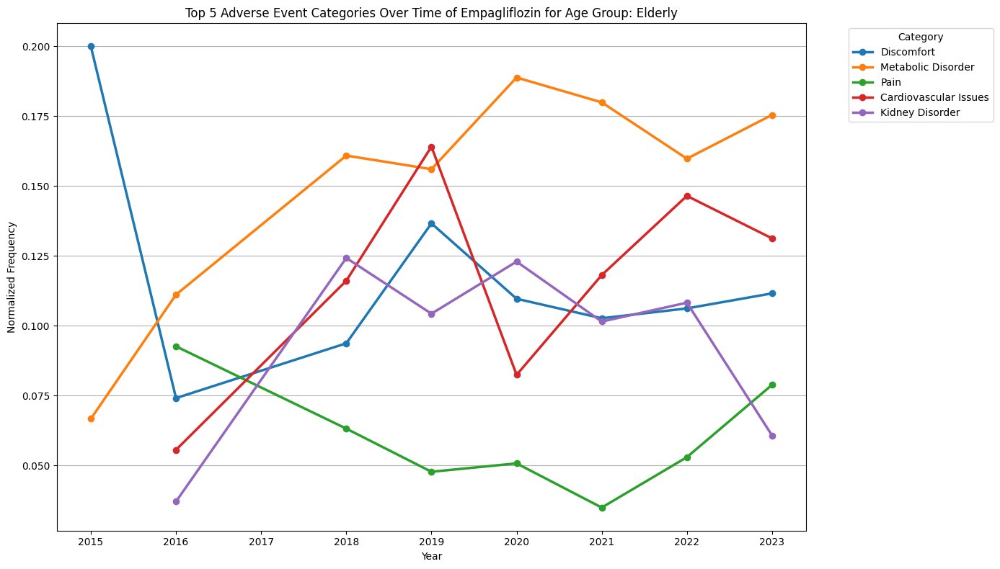

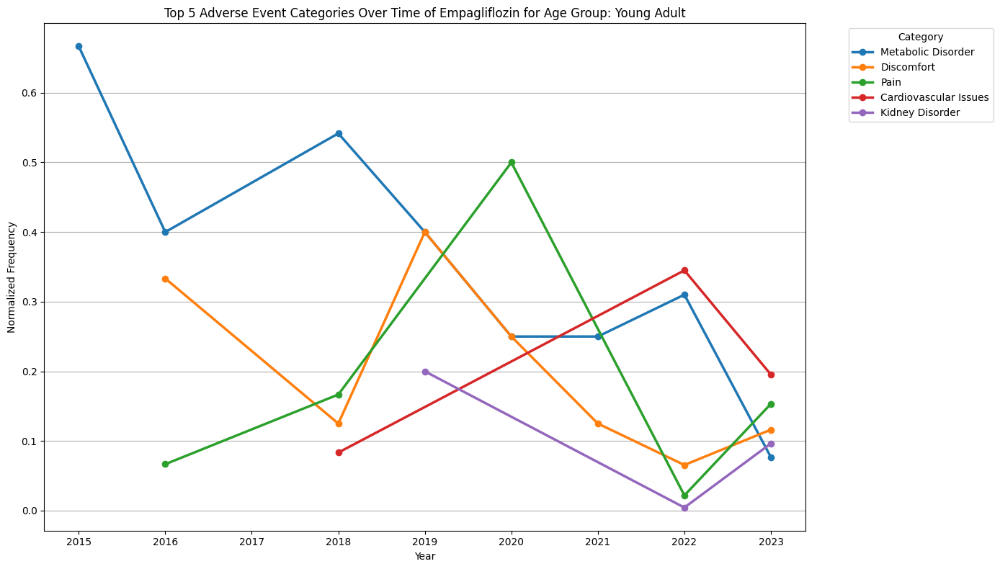

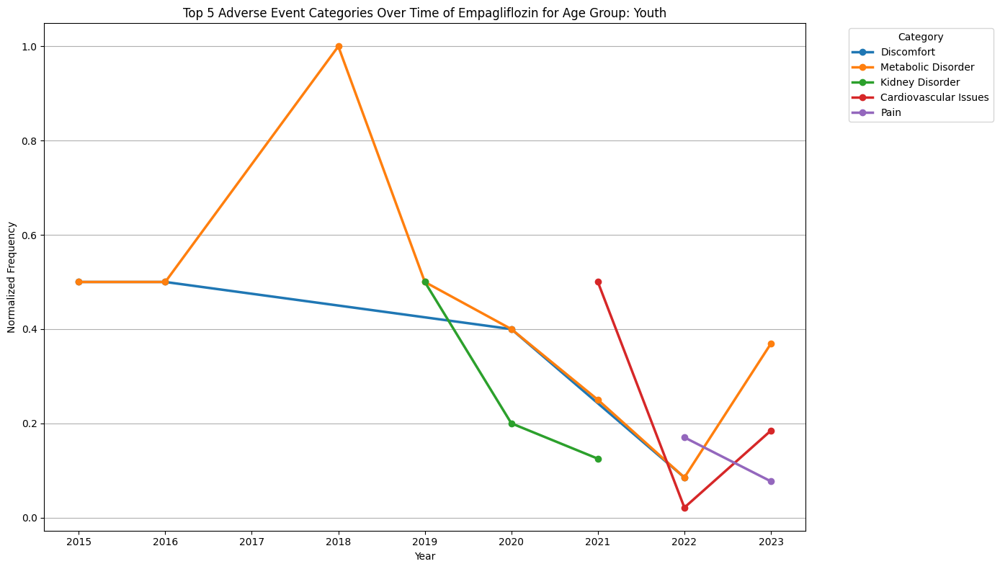

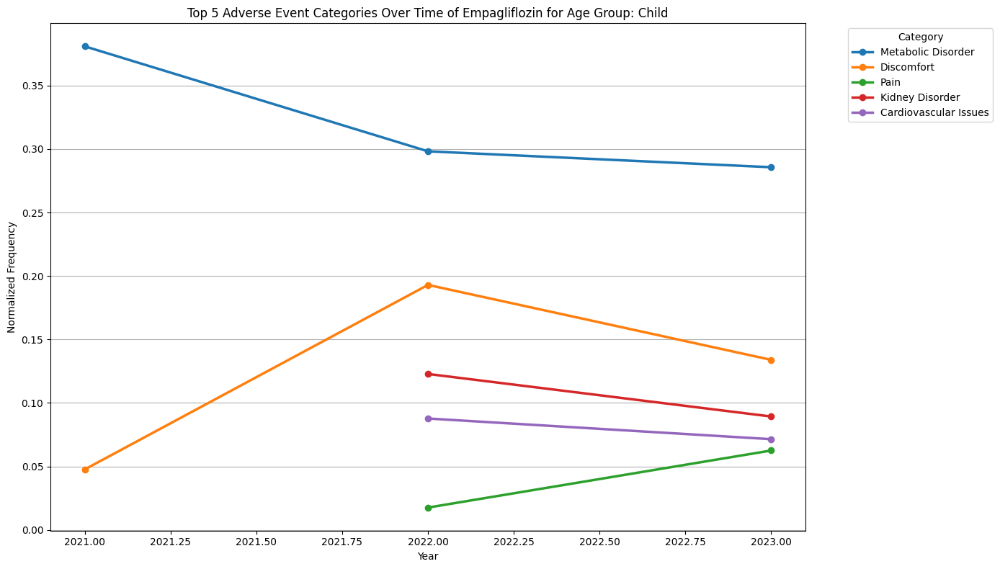

Table of Adverse Events and Their Frequency

Age Group: Adult
                    Category  Frequency  Percentage
12        Metabolic Disorder       1882   20.130495
4                 Discomfort       1224   13.092309
17                      Pain        785    8.396620
1      Cardiovascular Issues        758    8.107819
9            Kidney Disorder        651    6.963312
7        Infectious Disorder        614    6.567547
19           Skin Conditions        604    6.460584
3         Digestive Disorder        591    6.321532
18      Respiratory Disorder        448    4.791956
0             Blood Disorder        381    4.075302
15                    Nausea        274    2.930795
11           Mental Disorder        243    2.599208
8             Joint Disorder        140    1.497486
14  Musculoskeletal Disorder        138    1.476094
25           Weight Disorder        134    1.433308
16     Neurological Disorder        103    1.101722
5                      Fever        102    1.091026
10

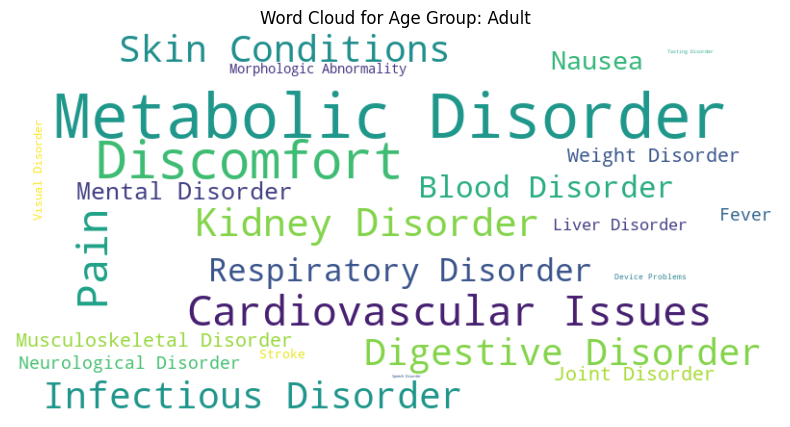

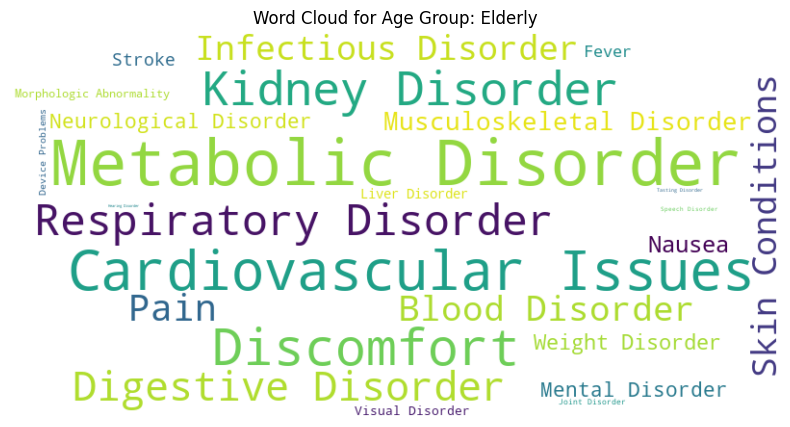

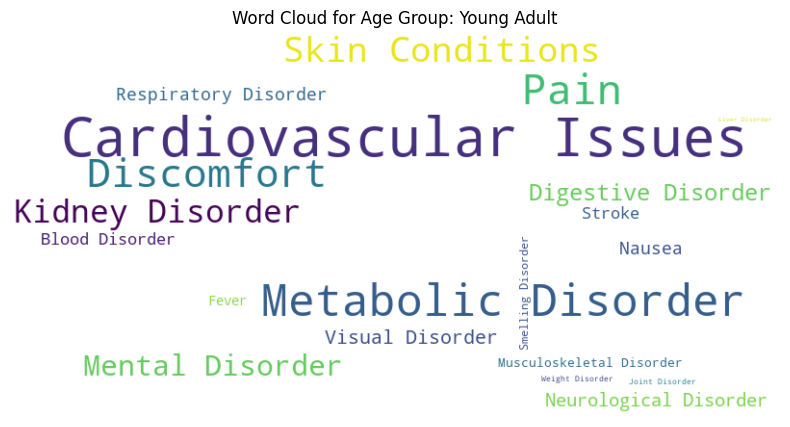

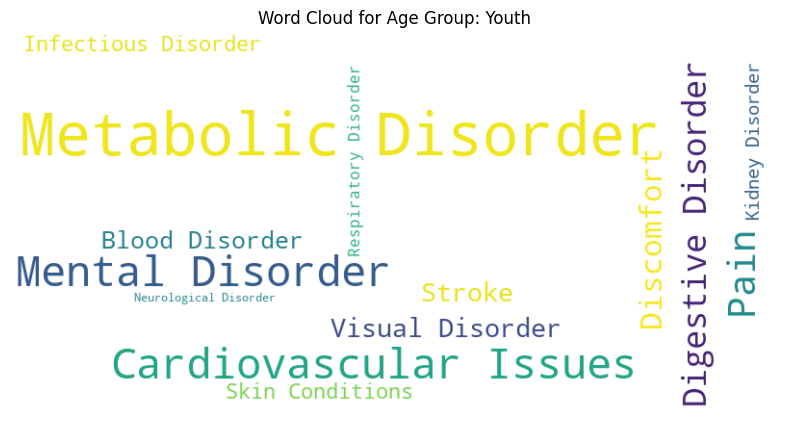

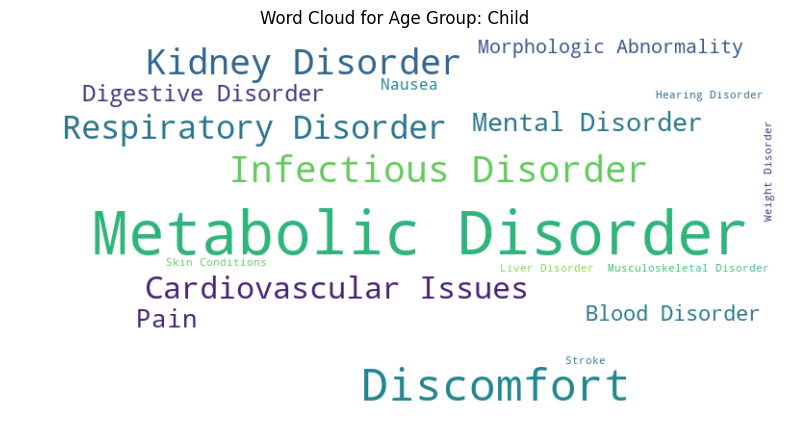

In [11]:
### EMPAGLIFLOZIN

# Create a reverse lookup dictionary from keywords to categories
category_keywords = {keyword: category for category, keywords in custom_AE_categories.items() for keyword in keywords}

# Preprocessing function
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    tokens = [word.lower() for word in word_tokenize(text) if word.isalpha() and word.lower() not in stop_words]
    return tokens

# Function to generate N-grams
def generate_ngrams(tokens, n=1):
    n_grams = list(ngrams(tokens, n))
    return [' '.join(gram) for gram in n_grams]

# Function to categorize N-grams
def categorize_ngrams(ngrams, category_keywords):
    categories = [category_keywords[ngram] for ngram in ngrams if ngram in category_keywords]
    return categories

# Initialize a dictionary for overall category frequencies by year and age group
category_counter_by_year_age_group = defaultdict(lambda: defaultdict(Counter))

# Define the path pattern for quarterly datasets from 2013 to 2023
base_path = '../Datasets/Yearly datasets/drugs reac age group/empagliflozin'
file_pattern = os.path.join(base_path, 'empagliflozin_reac_demo_*.csv')

# Get the list of file paths and sort them by year
file_paths = sorted(glob.glob(file_pattern), key=lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0]))

# Loop through each sorted file
for file_path in file_paths:
    print(f"Processing file: {file_path}")
    
    # Extract year from the file name (assuming the year is in the file name)
    year = int(os.path.basename(file_path).split('_')[-1].split('.')[0])

    # Load the CSV file
    file_df = pd.read_csv(file_path)
    
    # Convert the 'pt' column to lowercase and preprocess
    file_df['pt'] = file_df['pt'].str.lower()

    # Tokenize and generate N-grams for the pt column
    file_df['tokens'] = file_df['pt'].apply(preprocess_text)
    file_df['unigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 1))
    file_df['bigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 2))
    file_df['trigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 3))
    file_df['fourgrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 4))

    # Combine unigrams, bigrams, trigrams, and fourgrams into one column
    file_df['all_ngrams'] = file_df['unigrams'] + file_df['bigrams'] + file_df['trigrams'] + file_df['fourgrams']

    # Apply categorization function to the all_ngrams column
    file_df['categories'] = file_df['all_ngrams'].apply(lambda x: categorize_ngrams(x, category_keywords))

    # Process by age group and year
    for age_group, group_df in file_df.groupby('age_group'):
        # Count frequency of each category for this age group and year
        category_counter = Counter()
        for category_list in group_df['categories']:
            category_counter.update(category_list)
        
        # Update the overall category counter for this age group and year
        category_counter_by_year_age_group[year][age_group].update(category_counter)

# Convert the category counters to a DataFrame for visualization
category_data = []

for year, age_group_data in category_counter_by_year_age_group.items():
    for age_group, counter in age_group_data.items():
        total_events = sum(counter.values())
        for category, count in counter.items():
            category_data.append({
                'Year': year,
                'Age Group': age_group,
                'Category': category,
                'Count': count,
                'Normalized Count': count / total_events
            })

category_df = pd.DataFrame(category_data)

# Identify the top 5 categories overall for plotting the line chart
top_categories_overall = category_df.groupby('Category')['Count'].sum().nlargest(5).index

# Filter the DataFrame for only the top 5 categories for line chart
category_df_top = category_df[category_df['Category'].isin(top_categories_overall)]

# Plot line charts for each age group for the top 5 categories
for age_group in category_df_top['Age Group'].unique():
    age_group_df = category_df_top[category_df_top['Age Group'] == age_group]
    
    plt.figure(figsize=(14, 8))
    
    for category in age_group_df['Category'].unique():
        category_df_filtered = age_group_df[age_group_df['Category'] == category]
        plt.plot(category_df_filtered['Year'], category_df_filtered['Normalized Count'], marker='o', label=category, linewidth=2.5)
    
    plt.title(f'Top 5 Adverse Event Categories Over Time of Empagliflozin for Age Group: {age_group}')
    plt.xlabel('Year')
    plt.ylabel('Normalized Frequency')
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()


# Display the table of adverse events and their frequency
print("Table of Adverse Events and Their Frequency")
for age_group in category_df['Age Group'].unique():
    print(f"\nAge Group: {age_group}")
    age_group_df = category_df[category_df['Age Group'] == age_group]
    table = age_group_df.pivot_table(index='Year', columns='Category', values='Count', aggfunc='sum', fill_value=0)
    total_frequencies = table.sum().reset_index()
    total_frequencies.columns = ['Category', 'Frequency']
    total_frequencies['Percentage'] = (total_frequencies['Frequency'] / total_frequencies['Frequency'].sum()) * 100
    total_frequencies = total_frequencies.sort_values(by='Frequency', ascending=False)
    total_frequencies = total_frequencies[['Category', 'Frequency', 'Percentage']]
    print(total_frequencies)

# Generate and display word clouds for all adverse events
for age_group in category_df['Age Group'].unique():
    age_group_df = category_df[category_df['Age Group'] == age_group]
    
    # Sum counts for all categories
    wordcloud_data = age_group_df.groupby('Category')['Count'].sum().to_dict()
    
    # Create and display word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Age Group: {age_group}')
    plt.show()

Processing file: ../Datasets/Yearly datasets/drugs reac age group/exenatide/exenatide_reac_demo_2013.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/exenatide/exenatide_reac_demo_2014.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/exenatide/exenatide_reac_demo_2015.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/exenatide/exenatide_reac_demo_2016.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/exenatide/exenatide_reac_demo_2017.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/exenatide/exenatide_reac_demo_2018.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/exenatide/exenatide_reac_demo_2019.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/exenatide/exenatide_reac_demo_2020.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/exenatide/exenatide_reac_demo_2021.csv
Processing file: ../Datasets/Yearly datasets/drugs reac

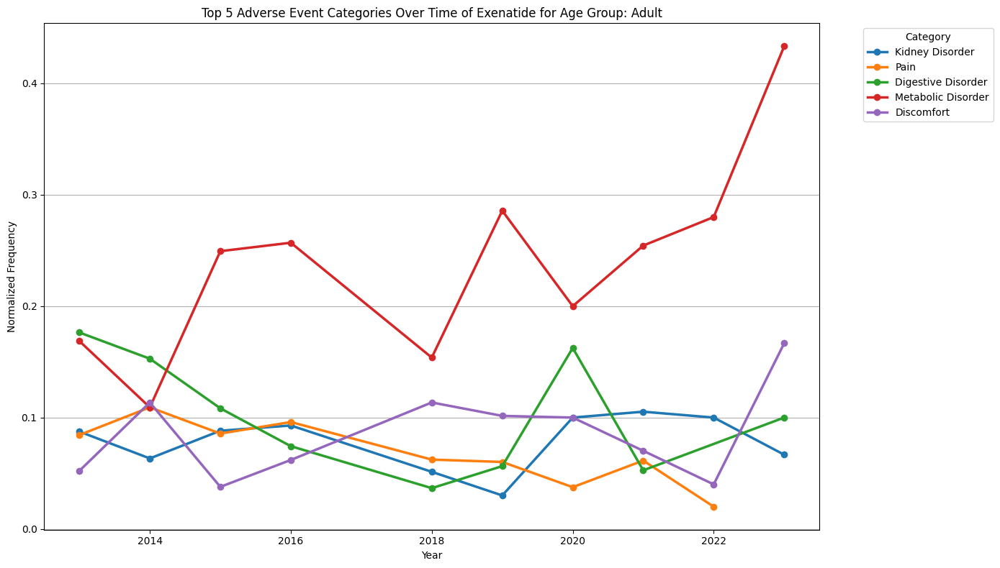

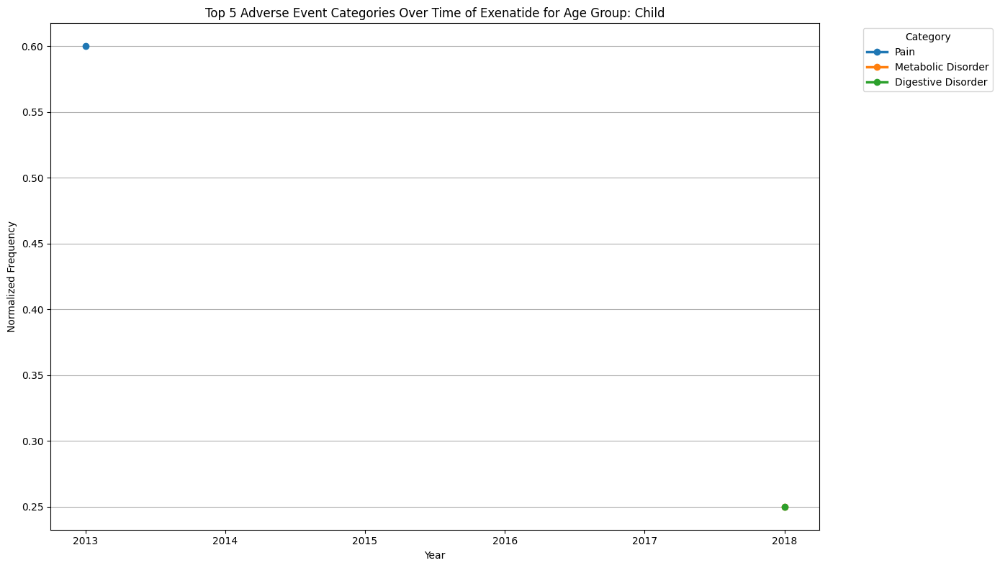

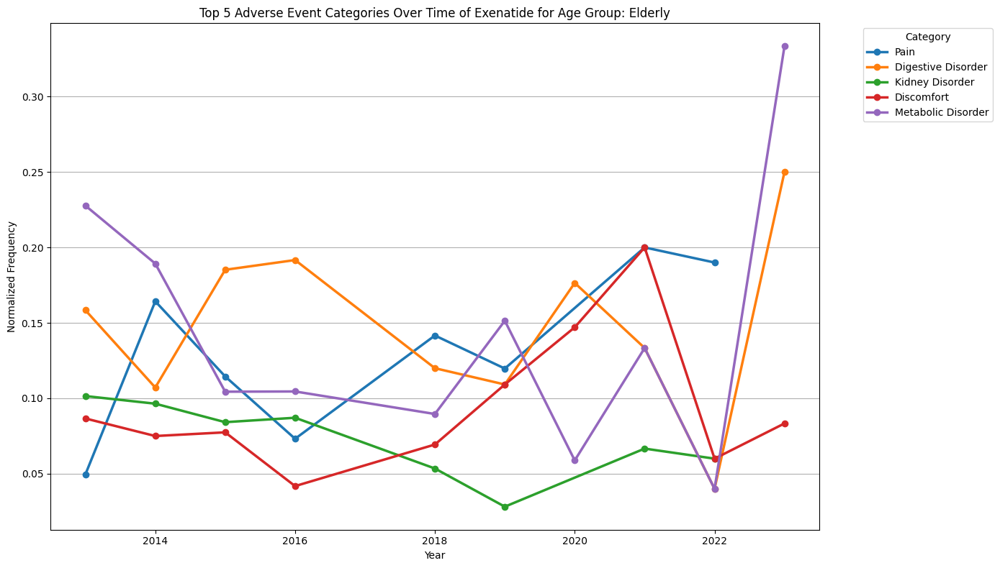

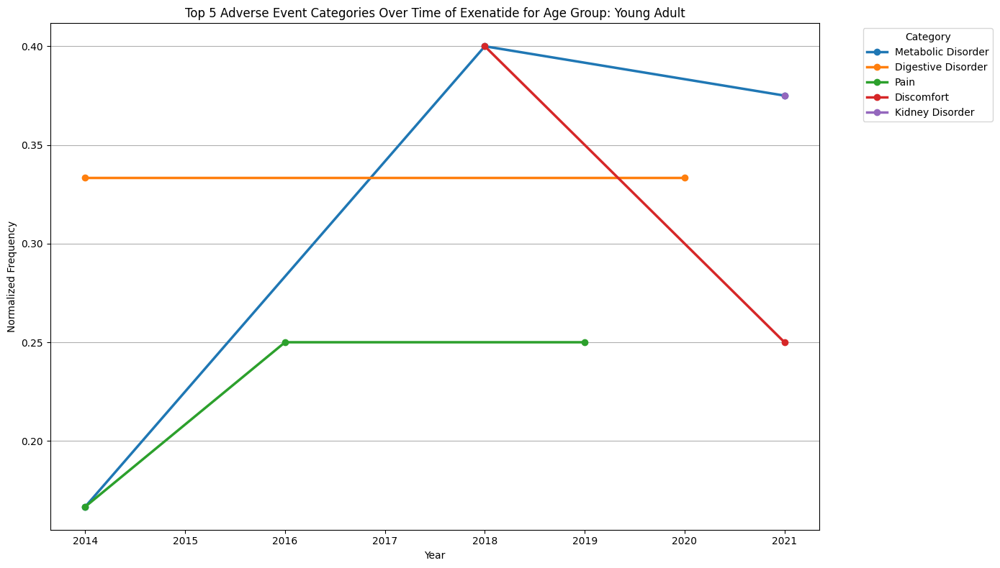

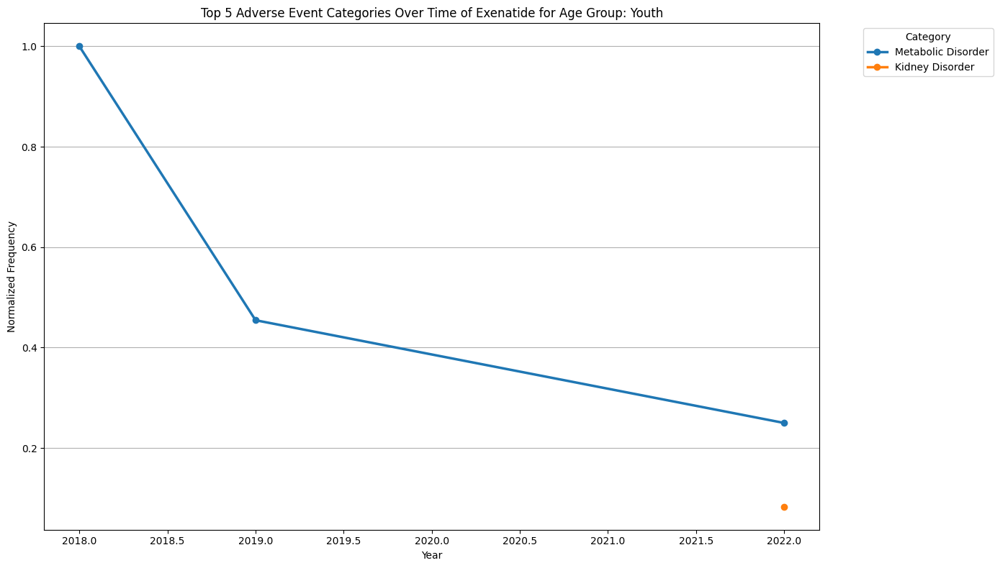

Table of Adverse Events and Their Frequency

Age Group: Adult
                    Category  Frequency  Percentage
12        Metabolic Disorder        532   20.128642
3         Digestive Disorder        299   11.312902
17                      Pain        214    8.096860
4                 Discomfort        202    7.642830
9            Kidney Disorder        200    7.567159
15                    Nausea        189    7.150965
18      Respiratory Disorder        150    5.675369
19           Skin Conditions        148    5.599697
1      Cardiovascular Issues        144    5.448354
24           Weight Disorder        127    4.805146
0             Blood Disorder        106    4.010594
11           Mental Disorder         82    3.102535
7        Infectious Disorder         79    2.989028
16     Neurological Disorder         39    1.475596
14  Musculoskeletal Disorder         35    1.324253
23           Visual Disorder         29    1.097238
10            Liver Disorder         15    0.567537
13

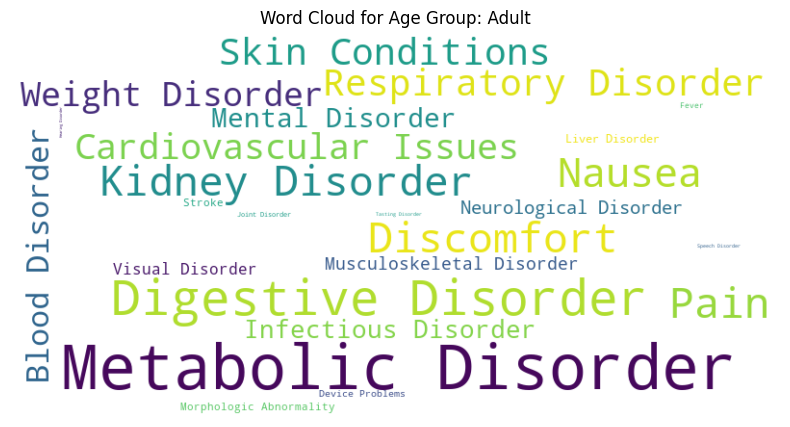

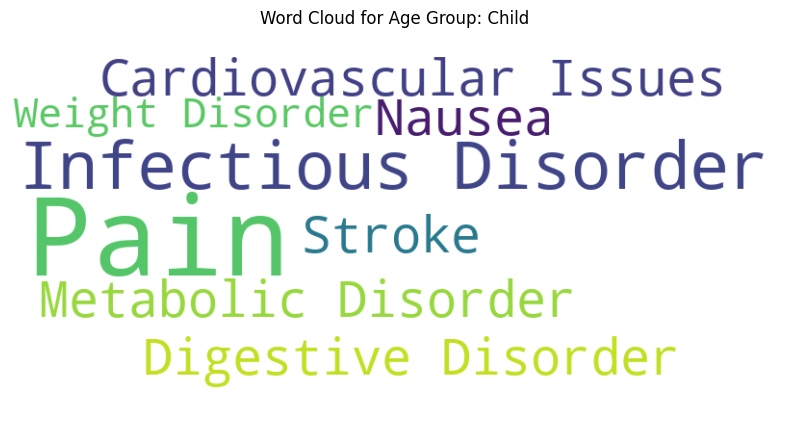

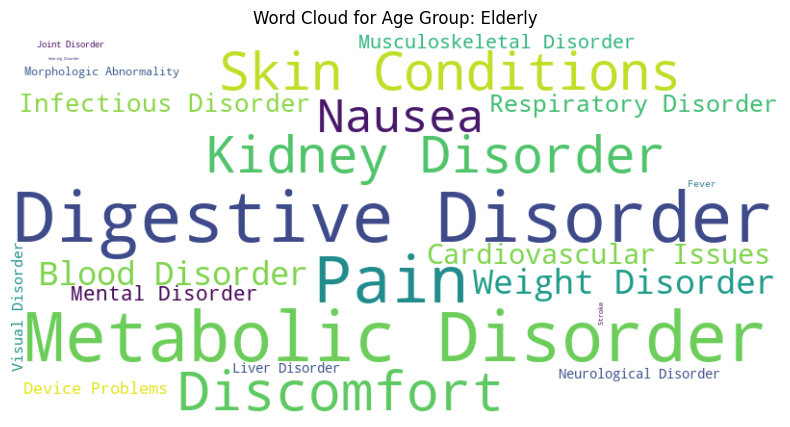

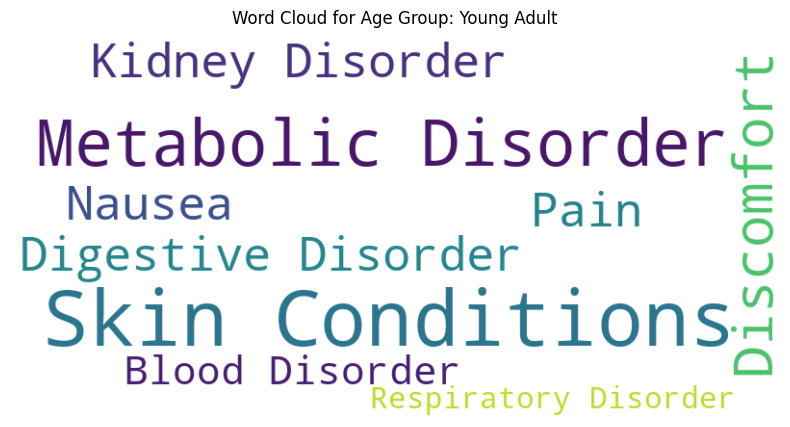

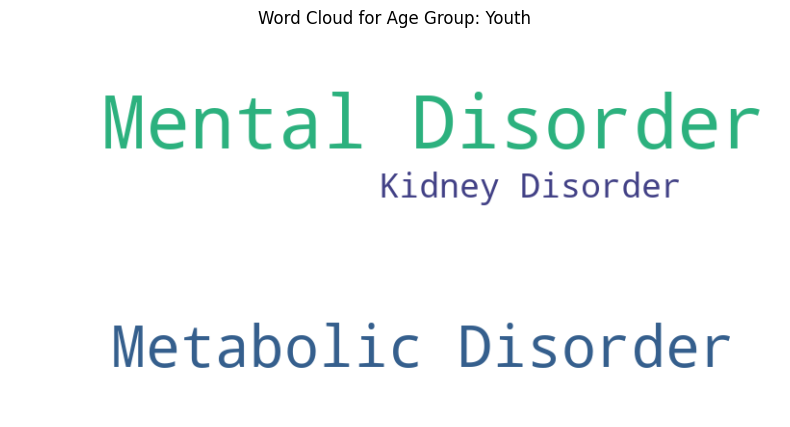

In [13]:
### EXENATIDE

# Create a reverse lookup dictionary from keywords to categories
category_keywords = {keyword: category for category, keywords in custom_AE_categories.items() for keyword in keywords}

# Preprocessing function
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    tokens = [word.lower() for word in word_tokenize(text) if word.isalpha() and word.lower() not in stop_words]
    return tokens

# Function to generate N-grams
def generate_ngrams(tokens, n=1):
    n_grams = list(ngrams(tokens, n))
    return [' '.join(gram) for gram in n_grams]

# Function to categorize N-grams
def categorize_ngrams(ngrams, category_keywords):
    categories = [category_keywords[ngram] for ngram in ngrams if ngram in category_keywords]
    return categories

# Initialize a dictionary for overall category frequencies by year and age group
category_counter_by_year_age_group = defaultdict(lambda: defaultdict(Counter))

# Define the path pattern for quarterly datasets from 2013 to 2023
base_path = '../Datasets/Yearly datasets/drugs reac age group/exenatide'
file_pattern = os.path.join(base_path, 'exenatide_reac_demo_*.csv')

# Get the list of file paths and sort them by year
file_paths = sorted(glob.glob(file_pattern), key=lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0]))

# Loop through each sorted file
for file_path in file_paths:
    print(f"Processing file: {file_path}")
    
    # Extract year from the file name (assuming the year is in the file name)
    year = int(os.path.basename(file_path).split('_')[-1].split('.')[0])

    # Load the CSV file
    file_df = pd.read_csv(file_path)
    
    # Convert the 'pt' column to lowercase and preprocess
    file_df['pt'] = file_df['pt'].str.lower()

    # Tokenize and generate N-grams for the pt column
    file_df['tokens'] = file_df['pt'].apply(preprocess_text)
    file_df['unigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 1))
    file_df['bigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 2))
    file_df['trigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 3))
    file_df['fourgrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 4))

    # Combine unigrams, bigrams, trigrams, and fourgrams into one column
    file_df['all_ngrams'] = file_df['unigrams'] + file_df['bigrams'] + file_df['trigrams'] + file_df['fourgrams']

    # Apply categorization function to the all_ngrams column
    file_df['categories'] = file_df['all_ngrams'].apply(lambda x: categorize_ngrams(x, category_keywords))

    # Process by age group and year
    for age_group, group_df in file_df.groupby('age_group'):
        # Count frequency of each category for this age group and year
        category_counter = Counter()
        for category_list in group_df['categories']:
            category_counter.update(category_list)
        
        # Update the overall category counter for this age group and year
        category_counter_by_year_age_group[year][age_group].update(category_counter)

# Convert the category counters to a DataFrame for visualization
category_data = []

for year, age_group_data in category_counter_by_year_age_group.items():
    for age_group, counter in age_group_data.items():
        total_events = sum(counter.values())
        for category, count in counter.items():
            category_data.append({
                'Year': year,
                'Age Group': age_group,
                'Category': category,
                'Count': count,
                'Normalized Count': count / total_events
            })

category_df = pd.DataFrame(category_data)

# Identify the top 5 categories overall for plotting the line chart
top_categories_overall = category_df.groupby('Category')['Count'].sum().nlargest(5).index

# Filter the DataFrame for only the top 5 categories for line chart
category_df_top = category_df[category_df['Category'].isin(top_categories_overall)]

# Plot line charts for each age group for the top 5 categories
for age_group in category_df_top['Age Group'].unique():
    age_group_df = category_df_top[category_df_top['Age Group'] == age_group]
    
    plt.figure(figsize=(14, 8))
    
    for category in age_group_df['Category'].unique():
        category_df_filtered = age_group_df[age_group_df['Category'] == category]
        plt.plot(category_df_filtered['Year'], category_df_filtered['Normalized Count'], marker='o', label=category, linewidth=2.5)
    
    plt.title(f'Top 5 Adverse Event Categories Over Time of Exenatide for Age Group: {age_group}')
    plt.xlabel('Year')
    plt.ylabel('Normalized Frequency')
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()


# Display the table of adverse events and their frequency
print("Table of Adverse Events and Their Frequency")
for age_group in category_df['Age Group'].unique():
    print(f"\nAge Group: {age_group}")
    age_group_df = category_df[category_df['Age Group'] == age_group]
    table = age_group_df.pivot_table(index='Year', columns='Category', values='Count', aggfunc='sum', fill_value=0)
    total_frequencies = table.sum().reset_index()
    total_frequencies.columns = ['Category', 'Frequency']
    total_frequencies['Percentage'] = (total_frequencies['Frequency'] / total_frequencies['Frequency'].sum()) * 100
    total_frequencies = total_frequencies.sort_values(by='Frequency', ascending=False)
    total_frequencies = total_frequencies[['Category', 'Frequency', 'Percentage']]
    print(total_frequencies)

# Generate and display word clouds for all adverse events
for age_group in category_df['Age Group'].unique():
    age_group_df = category_df[category_df['Age Group'] == age_group]
    
    # Sum counts for all categories
    wordcloud_data = age_group_df.groupby('Category')['Count'].sum().to_dict()
    
    # Create and display word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Age Group: {age_group}')
    plt.show()

Processing file: ../Datasets/Yearly datasets/drugs reac age group/semaglutide/semaglutide_reac_demo_2013.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/semaglutide/semaglutide_reac_demo_2014.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/semaglutide/semaglutide_reac_demo_2015.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/semaglutide/semaglutide_reac_demo_2016.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/semaglutide/semaglutide_reac_demo_2017.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/semaglutide/semaglutide_reac_demo_2018.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/semaglutide/semaglutide_reac_demo_2019.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/semaglutide/semaglutide_reac_demo_2020.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/semaglutide/semaglutide_reac_demo_2021.csv
Processing file: ..

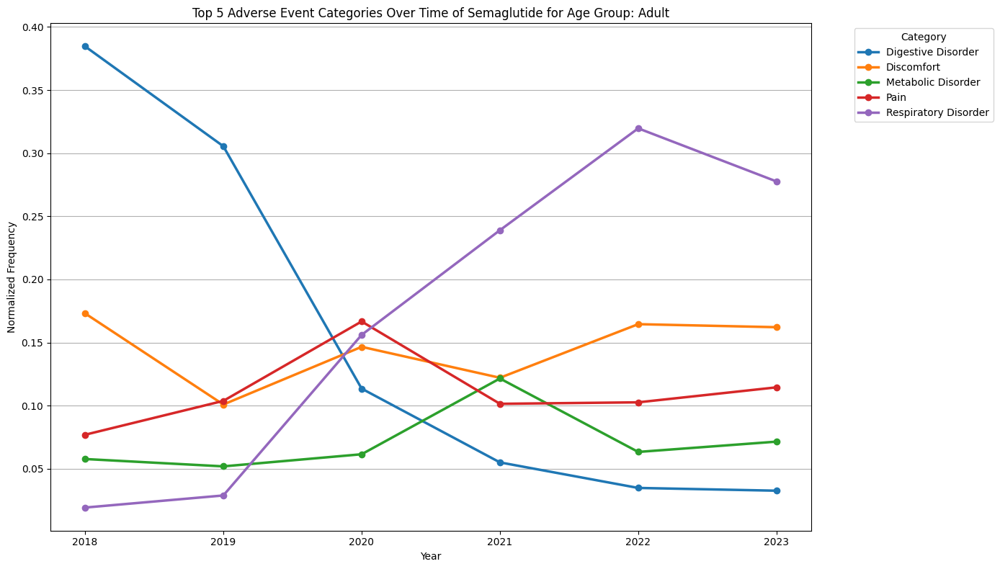

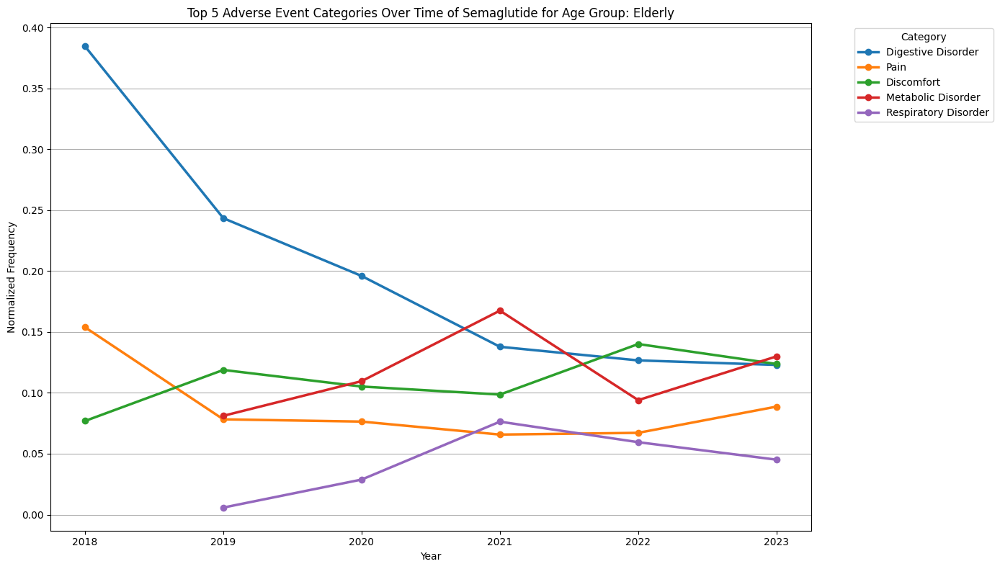

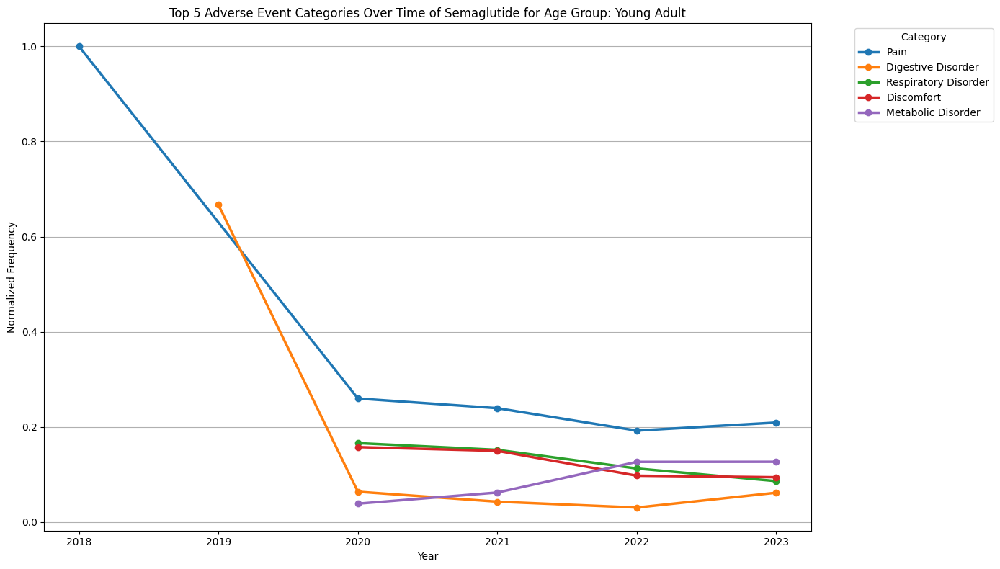

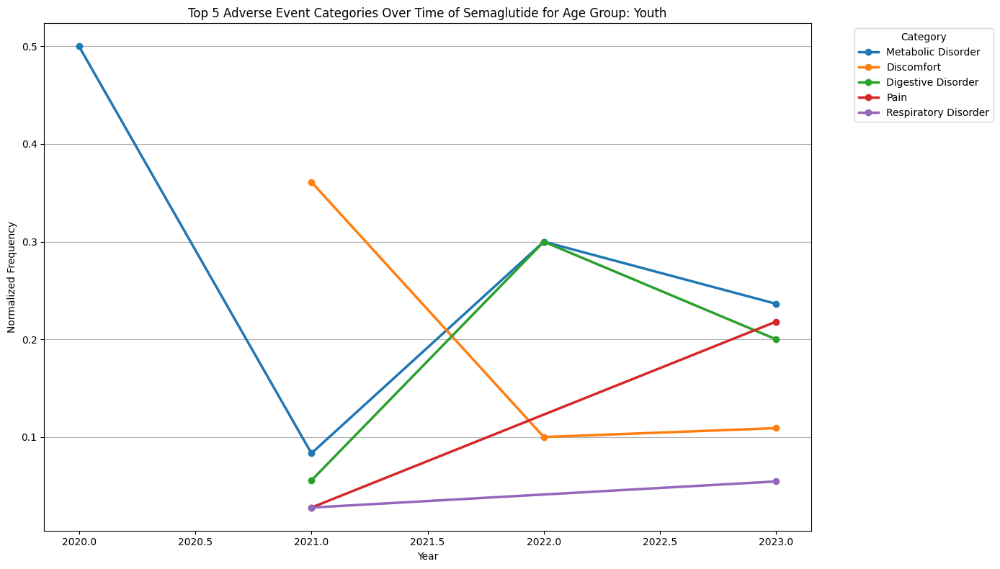

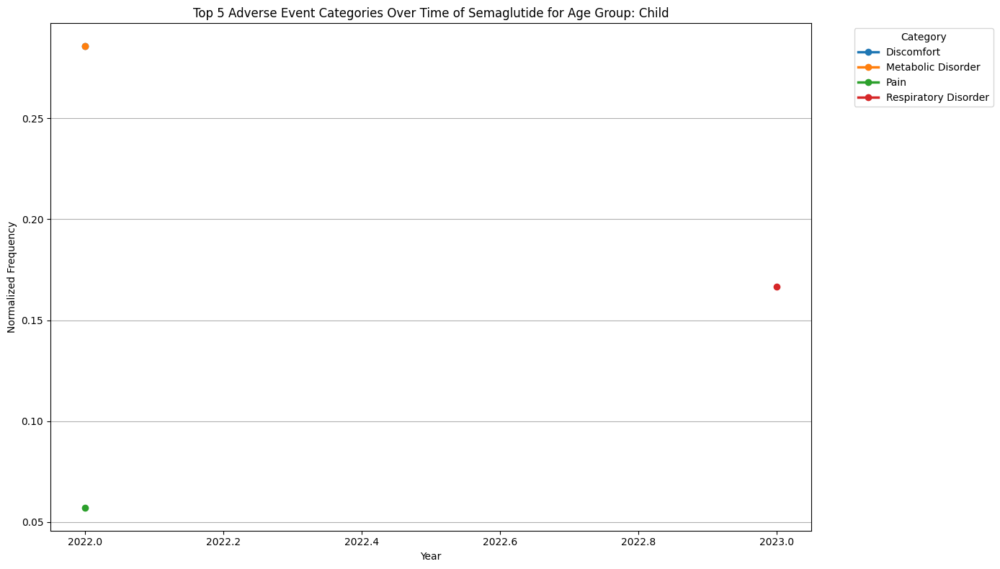

Table of Adverse Events and Their Frequency

Age Group: Adult
                        Category  Frequency  Percentage
20          Respiratory Disorder       3157   26.507137
4                     Discomfort       1834   15.398825
18                          Pain       1345   11.293031
12            Metabolic Disorder        899    7.548279
11               Mental Disorder        633    5.314861
3             Digestive Disorder        615    5.163728
7            Infectious Disorder        566    4.752309
1          Cardiovascular Issues        528    4.433249
15                        Nausea        380    3.190596
27               Weight Disorder        324    2.720403
9                Kidney Disorder        307    2.577666
21               Skin Conditions        280    2.350966
5                          Fever        233    1.956339
0                 Blood Disorder        140    1.175483
10                Liver Disorder        120    1.007557
14      Musculoskeletal Disorder        12

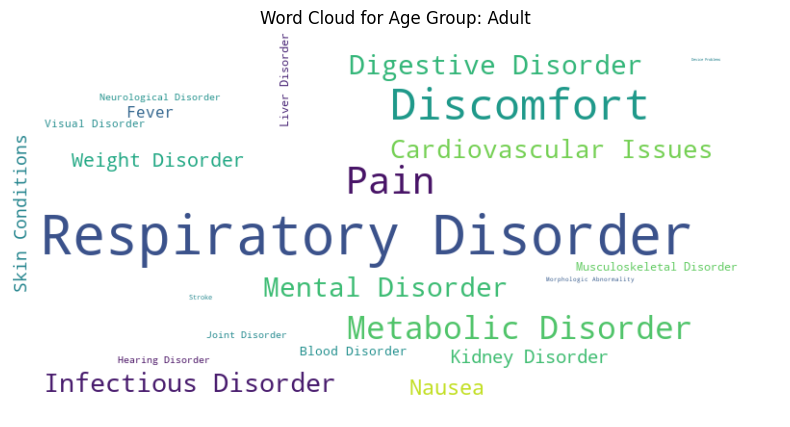

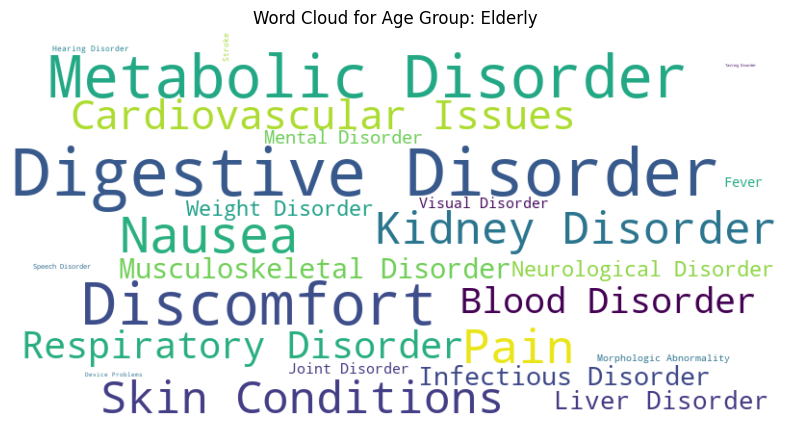

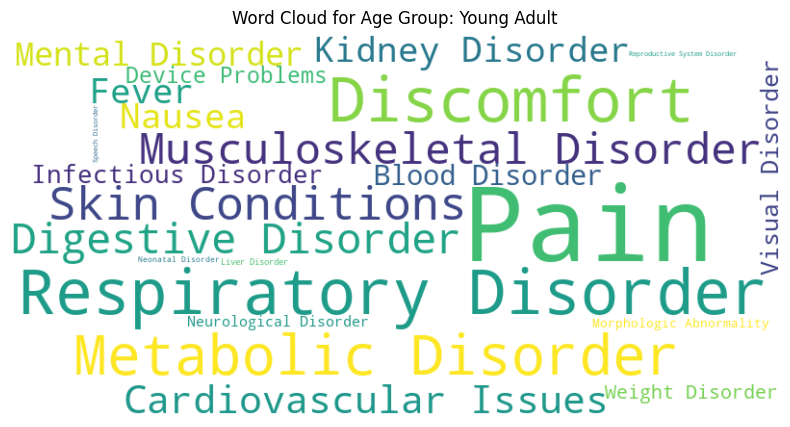

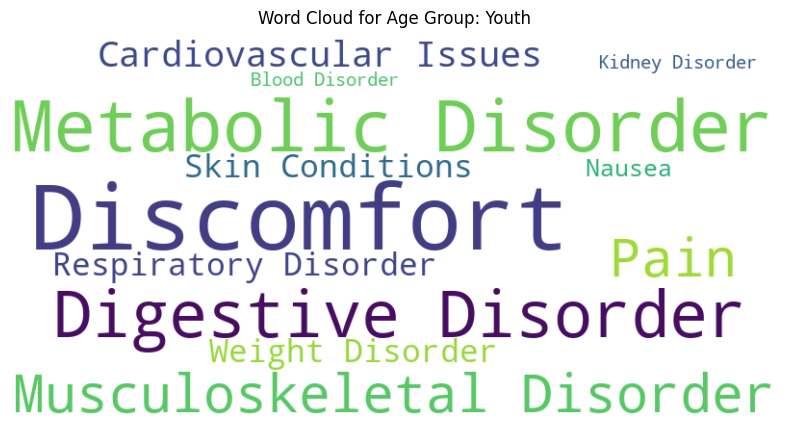

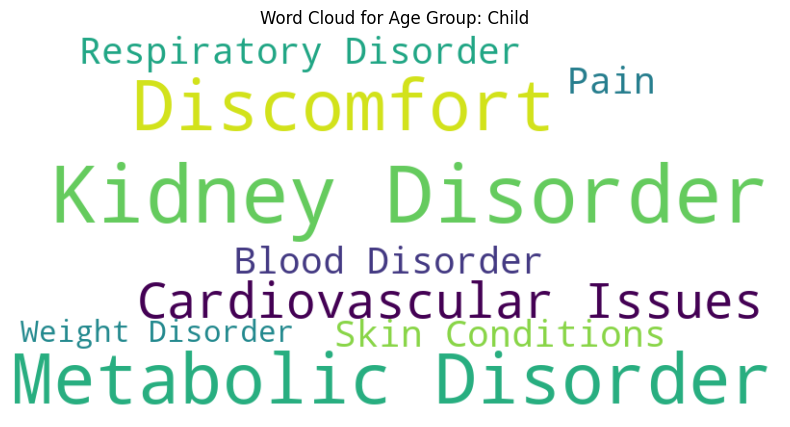

In [14]:
### SEMAGLUTIDE

# Create a reverse lookup dictionary from keywords to categories
category_keywords = {keyword: category for category, keywords in custom_AE_categories.items() for keyword in keywords}

# Preprocessing function
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    tokens = [word.lower() for word in word_tokenize(text) if word.isalpha() and word.lower() not in stop_words]
    return tokens

# Function to generate N-grams
def generate_ngrams(tokens, n=1):
    n_grams = list(ngrams(tokens, n))
    return [' '.join(gram) for gram in n_grams]

# Function to categorize N-grams
def categorize_ngrams(ngrams, category_keywords):
    categories = [category_keywords[ngram] for ngram in ngrams if ngram in category_keywords]
    return categories

# Initialize a dictionary for overall category frequencies by year and age group
category_counter_by_year_age_group = defaultdict(lambda: defaultdict(Counter))

# Define the path pattern for quarterly datasets from 2013 to 2023
base_path = '../Datasets/Yearly datasets/drugs reac age group/semaglutide'
file_pattern = os.path.join(base_path, 'semaglutide_reac_demo_*.csv')

# Get the list of file paths and sort them by year
file_paths = sorted(glob.glob(file_pattern), key=lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0]))

# Loop through each sorted file
for file_path in file_paths:
    print(f"Processing file: {file_path}")
    
    # Extract year from the file name (assuming the year is in the file name)
    year = int(os.path.basename(file_path).split('_')[-1].split('.')[0])

    # Load the CSV file
    file_df = pd.read_csv(file_path)
    
    # Convert the 'pt' column to lowercase and preprocess
    file_df['pt'] = file_df['pt'].str.lower()

    # Tokenize and generate N-grams for the pt column
    file_df['tokens'] = file_df['pt'].apply(preprocess_text)
    file_df['unigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 1))
    file_df['bigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 2))
    file_df['trigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 3))
    file_df['fourgrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 4))

    # Combine unigrams, bigrams, trigrams, and fourgrams into one column
    file_df['all_ngrams'] = file_df['unigrams'] + file_df['bigrams'] + file_df['trigrams'] + file_df['fourgrams']

    # Apply categorization function to the all_ngrams column
    file_df['categories'] = file_df['all_ngrams'].apply(lambda x: categorize_ngrams(x, category_keywords))

    # Process by age group and year
    for age_group, group_df in file_df.groupby('age_group'):
        # Count frequency of each category for this age group and year
        category_counter = Counter()
        for category_list in group_df['categories']:
            category_counter.update(category_list)
        
        # Update the overall category counter for this age group and year
        category_counter_by_year_age_group[year][age_group].update(category_counter)

# Convert the category counters to a DataFrame for visualization
category_data = []

for year, age_group_data in category_counter_by_year_age_group.items():
    for age_group, counter in age_group_data.items():
        total_events = sum(counter.values())
        for category, count in counter.items():
            category_data.append({
                'Year': year,
                'Age Group': age_group,
                'Category': category,
                'Count': count,
                'Normalized Count': count / total_events
            })

category_df = pd.DataFrame(category_data)

# Identify the top 5 categories overall for plotting the line chart
top_categories_overall = category_df.groupby('Category')['Count'].sum().nlargest(5).index

# Filter the DataFrame for only the top 5 categories for line chart
category_df_top = category_df[category_df['Category'].isin(top_categories_overall)]

# Plot line charts for each age group for the top 5 categories
for age_group in category_df_top['Age Group'].unique():
    age_group_df = category_df_top[category_df_top['Age Group'] == age_group]
    
    plt.figure(figsize=(14, 8))
    
    for category in age_group_df['Category'].unique():
        category_df_filtered = age_group_df[age_group_df['Category'] == category]
        plt.plot(category_df_filtered['Year'], category_df_filtered['Normalized Count'], marker='o', label=category, linewidth=2.5)
    
    plt.title(f'Top 5 Adverse Event Categories Over Time of Semaglutide for Age Group: {age_group}')
    plt.xlabel('Year')
    plt.ylabel('Normalized Frequency')
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()


# Display the table of adverse events and their frequency
print("Table of Adverse Events and Their Frequency")
for age_group in category_df['Age Group'].unique():
    print(f"\nAge Group: {age_group}")
    age_group_df = category_df[category_df['Age Group'] == age_group]
    table = age_group_df.pivot_table(index='Year', columns='Category', values='Count', aggfunc='sum', fill_value=0)
    total_frequencies = table.sum().reset_index()
    total_frequencies.columns = ['Category', 'Frequency']
    total_frequencies['Percentage'] = (total_frequencies['Frequency'] / total_frequencies['Frequency'].sum()) * 100
    total_frequencies = total_frequencies.sort_values(by='Frequency', ascending=False)
    total_frequencies = total_frequencies[['Category', 'Frequency', 'Percentage']]
    print(total_frequencies)

# Generate and display word clouds for all adverse events
for age_group in category_df['Age Group'].unique():
    age_group_df = category_df[category_df['Age Group'] == age_group]
    
    # Sum counts for all categories
    wordcloud_data = age_group_df.groupby('Category')['Count'].sum().to_dict()
    
    # Create and display word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Age Group: {age_group}')
    plt.show()

Processing file: ../Datasets/Yearly datasets/drugs reac age group/dulaglutide/dulaglutide_reac_demo_2013.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dulaglutide/dulaglutide_reac_demo_2014.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dulaglutide/dulaglutide_reac_demo_2015.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dulaglutide/dulaglutide_reac_demo_2016.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dulaglutide/dulaglutide_reac_demo_2017.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dulaglutide/dulaglutide_reac_demo_2018.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dulaglutide/dulaglutide_reac_demo_2019.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dulaglutide/dulaglutide_reac_demo_2020.csv
Processing file: ../Datasets/Yearly datasets/drugs reac age group/dulaglutide/dulaglutide_reac_demo_2021.csv
Processing file: ..

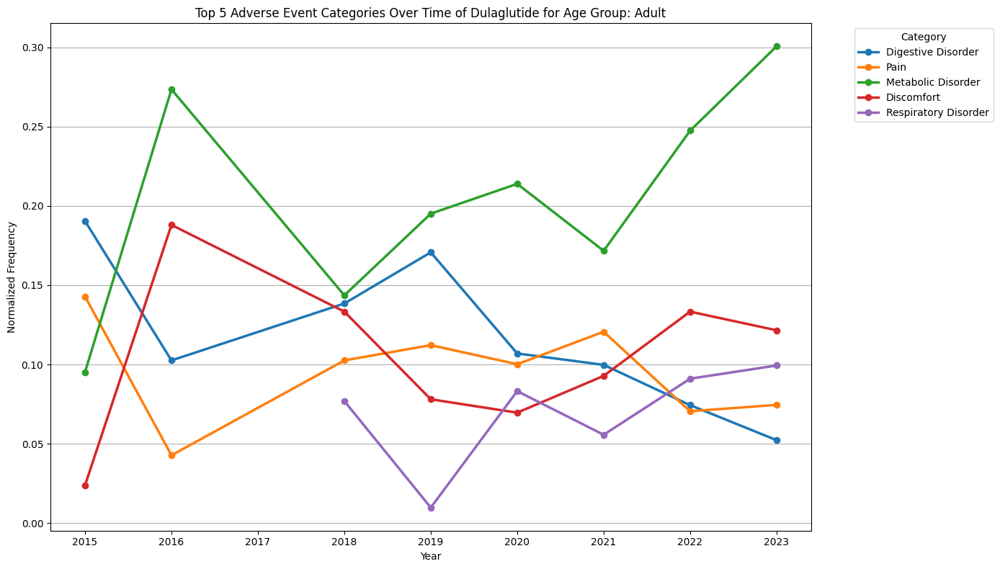

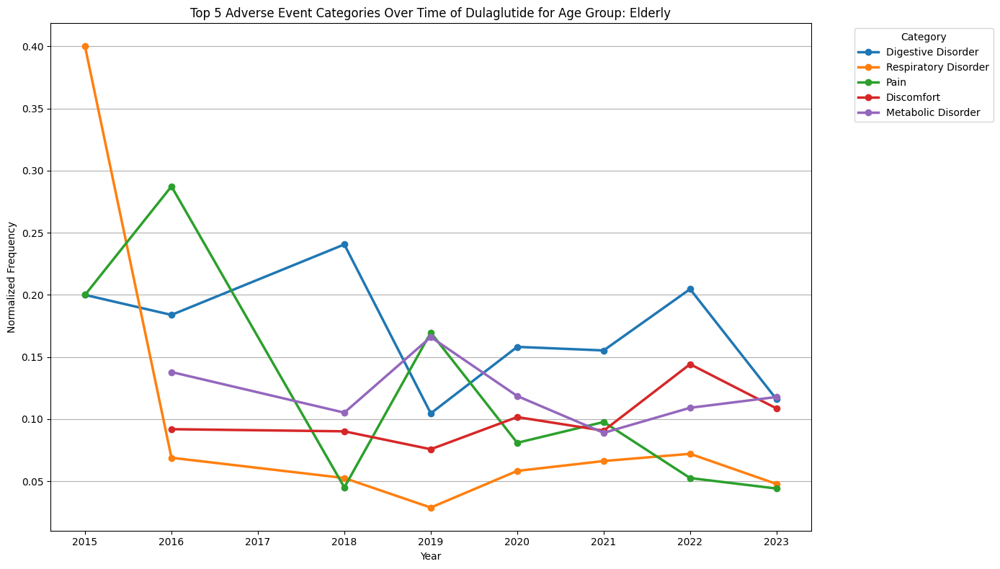

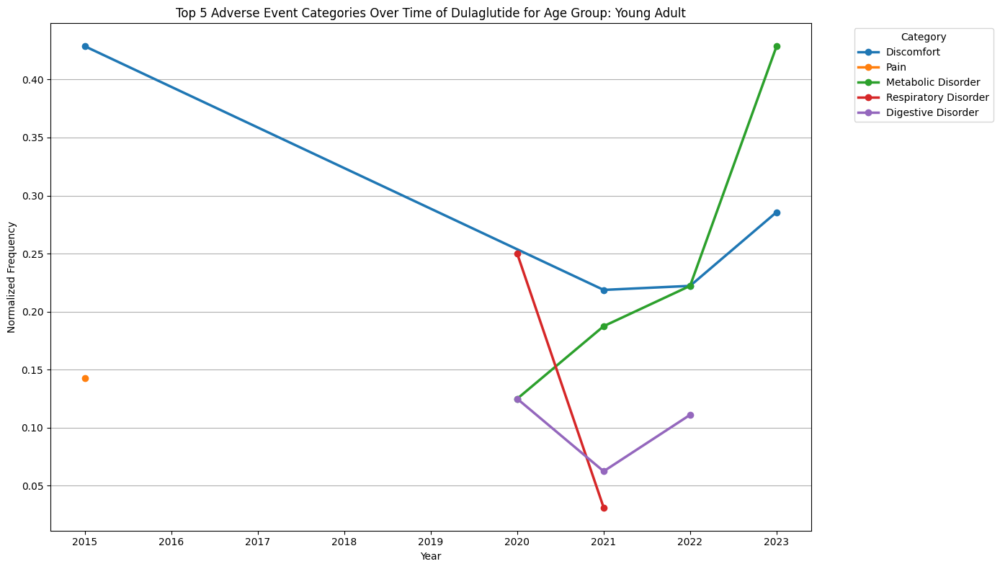

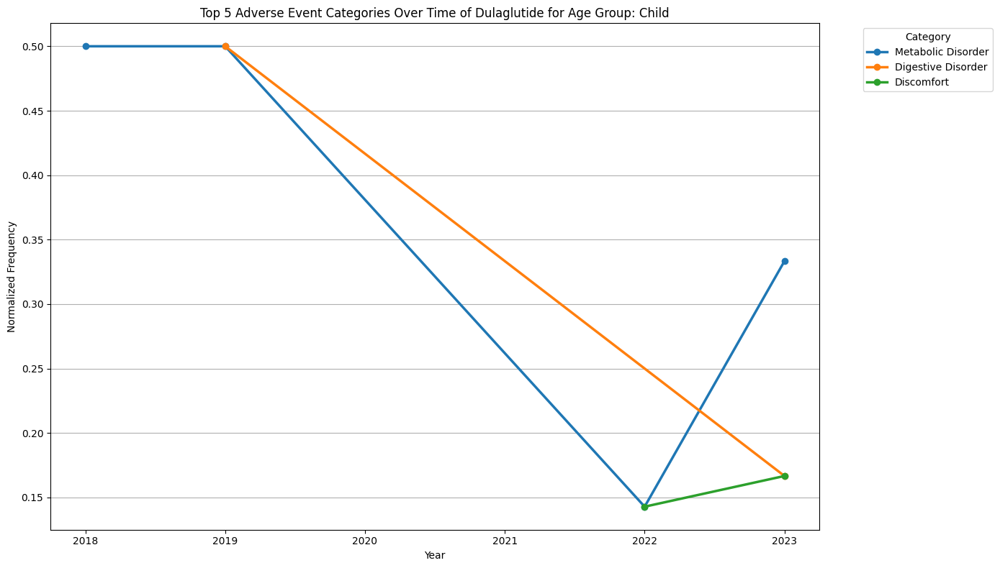

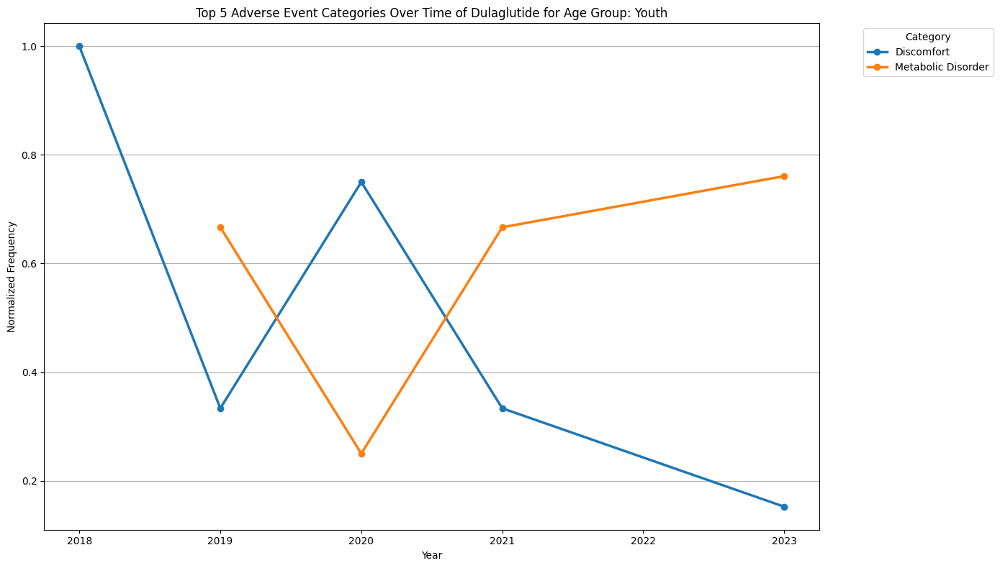

Table of Adverse Events and Their Frequency

Age Group: Adult
                    Category  Frequency  Percentage
11        Metabolic Disorder        727   23.271447
4                 Discomfort        343   10.979513
3         Digestive Disorder        286    9.154930
16                      Pain        277    8.866837
17      Respiratory Disorder        237    7.586428
18           Skin Conditions        234    7.490397
1      Cardiovascular Issues        184    5.889885
14                    Nausea        123    3.937260
8            Kidney Disorder        108    3.457106
6        Infectious Disorder        107    3.425096
10           Mental Disorder        100    3.201024
0             Blood Disorder         92    2.944942
24           Weight Disorder         64    2.048656
13  Musculoskeletal Disorder         48    1.536492
21                    Stroke         38    1.216389
15     Neurological Disorder         35    1.120359
12   Morphologic Abnormality         30    0.960307
22

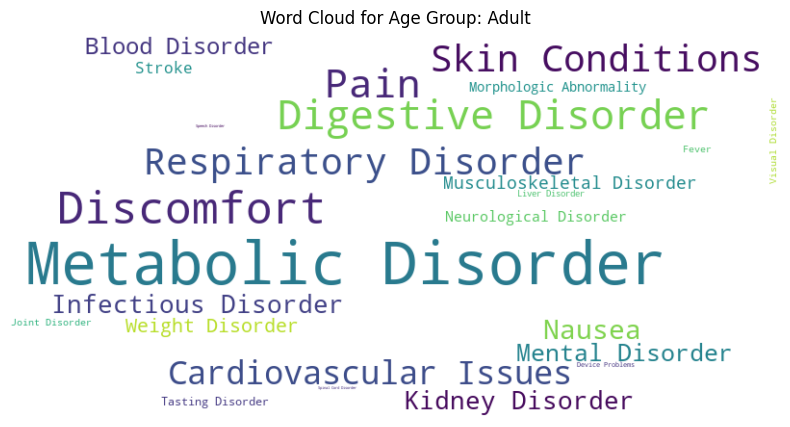

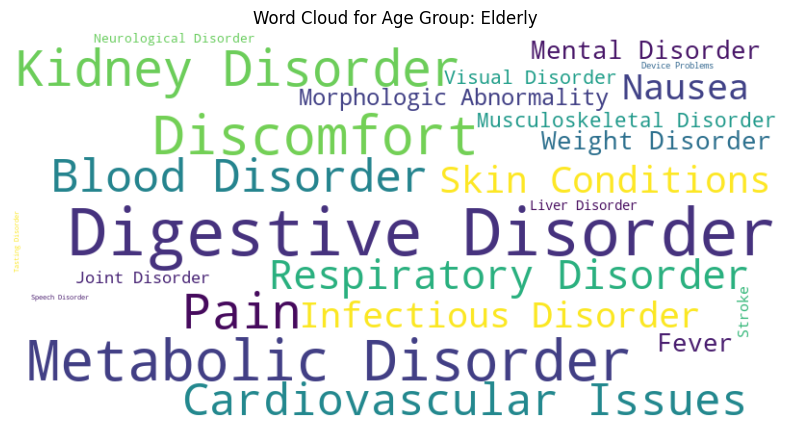

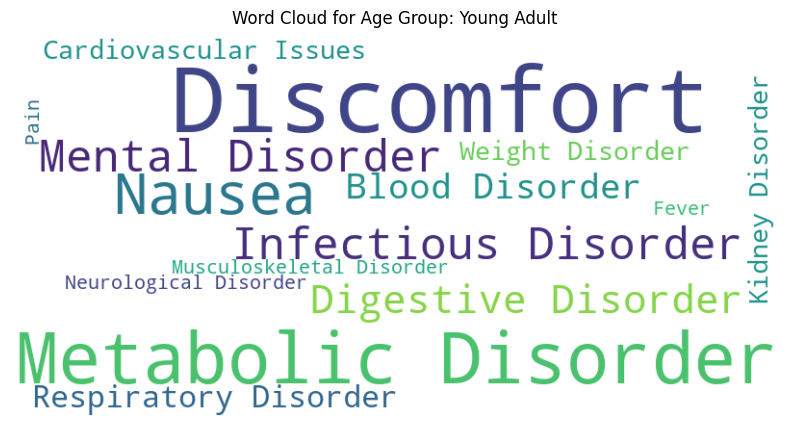

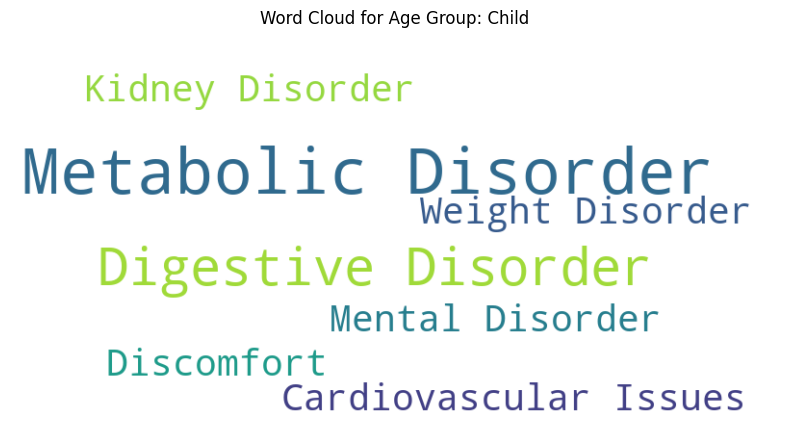

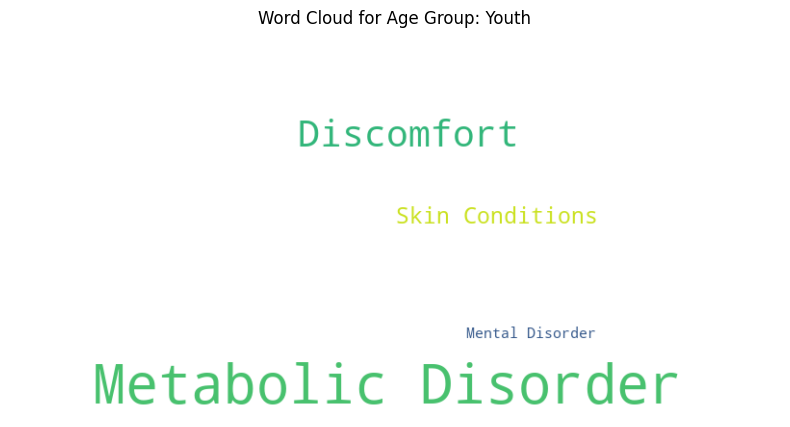

In [15]:
### DULAGLUTIDE

# Create a reverse lookup dictionary from keywords to categories
category_keywords = {keyword: category for category, keywords in custom_AE_categories.items() for keyword in keywords}

# Preprocessing function
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    tokens = [word.lower() for word in word_tokenize(text) if word.isalpha() and word.lower() not in stop_words]
    return tokens

# Function to generate N-grams
def generate_ngrams(tokens, n=1):
    n_grams = list(ngrams(tokens, n))
    return [' '.join(gram) for gram in n_grams]

# Function to categorize N-grams
def categorize_ngrams(ngrams, category_keywords):
    categories = [category_keywords[ngram] for ngram in ngrams if ngram in category_keywords]
    return categories

# Initialize a dictionary for overall category frequencies by year and age group
category_counter_by_year_age_group = defaultdict(lambda: defaultdict(Counter))

# Define the path pattern for quarterly datasets from 2013 to 2023
base_path = '../Datasets/Yearly datasets/drugs reac age group/dulaglutide'
file_pattern = os.path.join(base_path, 'dulaglutide_reac_demo_*.csv')

# Get the list of file paths and sort them by year
file_paths = sorted(glob.glob(file_pattern), key=lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0]))

# Loop through each sorted file
for file_path in file_paths:
    print(f"Processing file: {file_path}")
    
    # Extract year from the file name (assuming the year is in the file name)
    year = int(os.path.basename(file_path).split('_')[-1].split('.')[0])

    # Load the CSV file
    file_df = pd.read_csv(file_path)
    
    # Convert the 'pt' column to lowercase and preprocess
    file_df['pt'] = file_df['pt'].str.lower()

    # Tokenize and generate N-grams for the pt column
    file_df['tokens'] = file_df['pt'].apply(preprocess_text)
    file_df['unigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 1))
    file_df['bigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 2))
    file_df['trigrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 3))
    file_df['fourgrams'] = file_df['tokens'].apply(lambda x: generate_ngrams(x, 4))

    # Combine unigrams, bigrams, trigrams, and fourgrams into one column
    file_df['all_ngrams'] = file_df['unigrams'] + file_df['bigrams'] + file_df['trigrams'] + file_df['fourgrams']

    # Apply categorization function to the all_ngrams column
    file_df['categories'] = file_df['all_ngrams'].apply(lambda x: categorize_ngrams(x, category_keywords))

    # Process by age group and year
    for age_group, group_df in file_df.groupby('age_group'):
        # Count frequency of each category for this age group and year
        category_counter = Counter()
        for category_list in group_df['categories']:
            category_counter.update(category_list)
        
        # Update the overall category counter for this age group and year
        category_counter_by_year_age_group[year][age_group].update(category_counter)

# Convert the category counters to a DataFrame for visualization
category_data = []

for year, age_group_data in category_counter_by_year_age_group.items():
    for age_group, counter in age_group_data.items():
        total_events = sum(counter.values())
        for category, count in counter.items():
            category_data.append({
                'Year': year,
                'Age Group': age_group,
                'Category': category,
                'Count': count,
                'Normalized Count': count / total_events
            })

category_df = pd.DataFrame(category_data)

# Identify the top 5 categories overall for plotting the line chart
top_categories_overall = category_df.groupby('Category')['Count'].sum().nlargest(5).index

# Filter the DataFrame for only the top 5 categories for line chart
category_df_top = category_df[category_df['Category'].isin(top_categories_overall)]

# Plot line charts for each age group for the top 5 categories
for age_group in category_df_top['Age Group'].unique():
    age_group_df = category_df_top[category_df_top['Age Group'] == age_group]
    
    plt.figure(figsize=(14, 8))
    
    for category in age_group_df['Category'].unique():
        category_df_filtered = age_group_df[age_group_df['Category'] == category]
        plt.plot(category_df_filtered['Year'], category_df_filtered['Normalized Count'], marker='o', label=category, linewidth=2.5)
    
    plt.title(f'Top 5 Adverse Event Categories Over Time of Dulaglutide for Age Group: {age_group}')
    plt.xlabel('Year')
    plt.ylabel('Normalized Frequency')
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()


# Display the table of adverse events and their frequency
print("Table of Adverse Events and Their Frequency")
for age_group in category_df['Age Group'].unique():
    print(f"\nAge Group: {age_group}")
    age_group_df = category_df[category_df['Age Group'] == age_group]
    table = age_group_df.pivot_table(index='Year', columns='Category', values='Count', aggfunc='sum', fill_value=0)
    total_frequencies = table.sum().reset_index()
    total_frequencies.columns = ['Category', 'Frequency']
    total_frequencies['Percentage'] = (total_frequencies['Frequency'] / total_frequencies['Frequency'].sum()) * 100
    total_frequencies = total_frequencies.sort_values(by='Frequency', ascending=False)
    total_frequencies = total_frequencies[['Category', 'Frequency', 'Percentage']]
    print(total_frequencies)

# Generate and display word clouds for all adverse events
for age_group in category_df['Age Group'].unique():
    age_group_df = category_df[category_df['Age Group'] == age_group]
    
    # Sum counts for all categories
    wordcloud_data = age_group_df.groupby('Category')['Count'].sum().to_dict()
    
    # Create and display word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Age Group: {age_group}')
    plt.show()